In [19]:
import pandas as pd
import glob
import time 
import csv
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib import animation
import matplotlib.colors as mcolors
import statistics
import numpy as np
from scipy.optimize import curve_fit
from matplotlib.animation import FuncAnimation
from PIL import Image
import random


def read_generic(name, n_states):
    """
    Leitura genérica de CSV tab-delimitado contendo pares (estado, derivada) e em seguida seus objetivos.
    name     : caminho para o arquivo
    n_states : número de variáveis de estado (ex: 2 para 1D, 4 para 2D)
    Retorna dict com:
      - 'states': array shape (n_states, N)
      - 'goals' : array shape (n_states, N)
      - 't'     : vetor tempo shape (N,)
      - 'trial' : vetor trial shape (N,)
    """
    states, goals, t_list, trials = [], [], [], []
    with open(name, 'r') as f:
        reader = csv.reader(f, delimiter='\t')
        next(reader)  # pula header
        for row in reader:
            vals = list(map(float, row[0].split()))
            # primeiros n_states são os estados reais, próximos n_states são os objetivos
            s = np.array(vals[0:   n_states])
            g = np.array(vals[n_states:2*n_states])
            states.append(s)
            goals.append(g)
            t_list.append(float(row[1]))
            trials.append(float(row[2]))

    return {
        'states': np.vstack(states).T,
        'goals' : np.vstack(goals).T,
        't'     : np.array(t_list),
        'trial' : np.array(trials)
    }


def create_generic_series(Title, Subtitles, all_data, state_labels, t_lim=None):
    """
    Gráfico genérico de séries temporais para N estados.
    Title        : título geral
    Subtitles    : lista de legendas (uma por experimento)
    all_data     : lista de dicts retornados por read_generic
    state_labels : nomes das variáveis de estado
    t_lim        : limite de tempo em xlim
    """
    n = len(state_labels)
    fig, axes = plt.subplots(n, 1, sharex=True, figsize=(10, 5 * n))

    # 1) plota o degrau (goal) primeiro, para que fique em primeiro na legenda
    for i, name in enumerate(state_labels):
        axes[i].plot(all_data[0]['t'],
                     all_data[0]['goals'][i],
                     '--',
                     label=f"{name}_goal")
    # 2) agora plota as séries de dados
    for data, label in zip(all_data, Subtitles):
        for i, name in enumerate(state_labels):
            axes[i].plot(data['t'], data['states'][i], label=label)

    for i, name in enumerate(state_labels):
        axes[i].set_ylabel(name)
        if t_lim is not None:
            axes[i].set_xlim(0, t_lim)

    axes[-1].set_xlabel("Time [s]")
    fig.suptitle(Title)
    axes[0].legend(loc='upper right')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


# -------------------- Wrappers para retrocompatibilidade --------------------

def read_one(name):
    # Leitura 1D (posição e velocidade)
    # O CSV contém 4 variáveis (x, x_dot, y, y_dot) + seus objetivos,
    # mas aqui só extraímos os dois primeiros estados
    data = read_generic(name, n_states=4)
    # retornamos só x e x_dot (estados e metas)
    return {
        'states': data['states'][:2],
        'goals' : data['goals'][:2],
        't'     : data['t'],
        'trial' : data['trial']
    }


def Create_1D_Graphic(Title, Subtitles, Data):
    state_labels = ["x", "x_dot"]
    create_generic_series(Title, Subtitles, Data, state_labels, t_lim=5)


def Create_1D_Graphic2(Title, Subtitles, Data, t):
    state_labels = ["x", "x_dot"]
    create_generic_series(Title, Subtitles, Data, state_labels, t_lim=t)


def read_one_2D(name):
    # Leitura 2D (x, x_dot, y, y_dot)
    return read_generic(name, n_states=4)


def Create_2D_Graphic(Title, Data, t_lim=None):
    """
    Mantém layout espacial + de séries em X/Y, mas usando data dict.
    Title : título geral
    Data  : lista de dicts
    t_lim : limite de tempo nos eixos X/Y
    """
    fig = plt.figure(figsize=(20, 10))
    gs = gridspec.GridSpec(2, 3, width_ratios=[1, 2, 1])

    X  = plt.subplot(gs[0, 0]); X.set_title("Position X")
    XY = plt.subplot(gs[:, 1]);  XY.set_title("Position 2D")
    Y  = plt.subplot(gs[0, 2]); Y.set_title("Position Y")
    XD = plt.subplot(gs[1, 0]); XD.set_title("Velocity X")
    YD = plt.subplot(gs[1, 2]); YD.set_title("Velocity Y")

    # referência
    goal = Data[0]['goals']
    tvec = Data[0]['t']
    X.plot(tvec, goal[0], '--', label='x_goal')
    Y.plot(tvec, goal[2], '--', label='y_goal')
    XY.plot(goal[0], goal[2], 'o', label='goal')
    XD.plot(tvec, goal[1], '--', label='x_dot_goal')
    YD.plot(tvec, goal[3], '--', label='y_dot_goal')

    # dados reais
    for idx, D in enumerate(Data):
        lbl = f"Run {idx}"
        X.plot(D['t'], D['states'][0], label=lbl)
        Y.plot(D['t'], D['states'][2], label=lbl)
        XY.plot(D['states'][0], D['states'][2], label=lbl)
        XD.plot(D['t'], D['states'][1], label=lbl)
        YD.plot(D['t'], D['states'][3], label=lbl)

    # ajustes de limites e rótulos
    for ax in [X, XD, Y, YD]:
        if t_lim is not None:
            ax.set_xlim(0, t_lim)
        ax.set_xlabel("[s]")
    X.set_ylabel("[m]")
    XD.set_ylabel("[m/s]")
    Y.set_ylabel("[m]")
    YD.set_ylabel("[m/s]")

    XY.set_xlabel("X [m]")
    XY.set_ylabel("Y [m]")
    XY.set_xlim(-4, 4)
    XY.set_ylim(-4, 4)

    X.legend(loc='upper right')
    fig.suptitle(Title, fontsize=20)
    plt.tight_layout()
    plt.show()


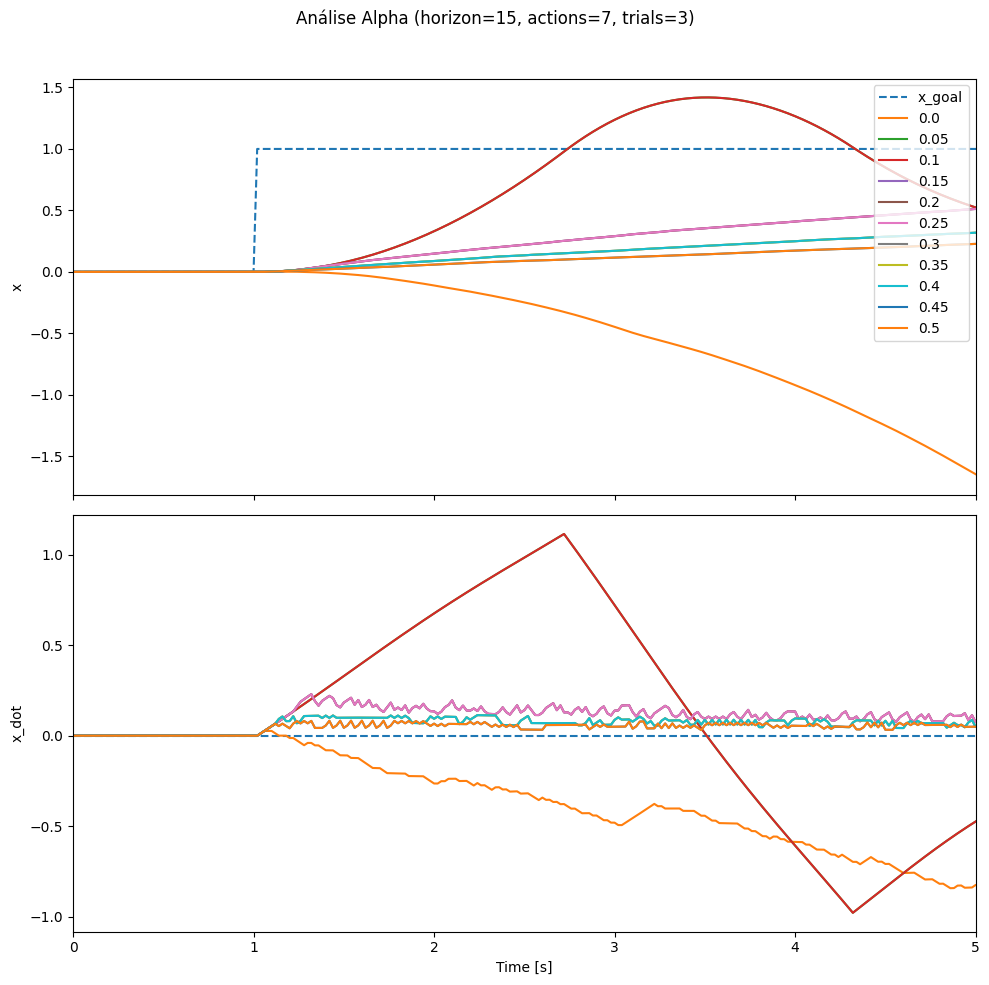

In [39]:
Data = []
L = []

# Sweep α: 0.00 → 0.50 em passo de 0.05 → 11 pontos
n_alpha = int(0.5 / 0.05) + 1  # = 11
for i in range(n_alpha):
    idx = i + 1
    alpha_val = round(i * 0.05, 2)
    # lê o CSV renomeado: Alfa1.csv … Alfa11.csv
    Data.append(read_one(f'Data/Alpha/1/Alpha{idx}Data0.csv'))
    L.append(alpha_val)

Create_1D_Graphic("Análise Alpha (horizon=15, actions=7, trials=3)",L,Data)


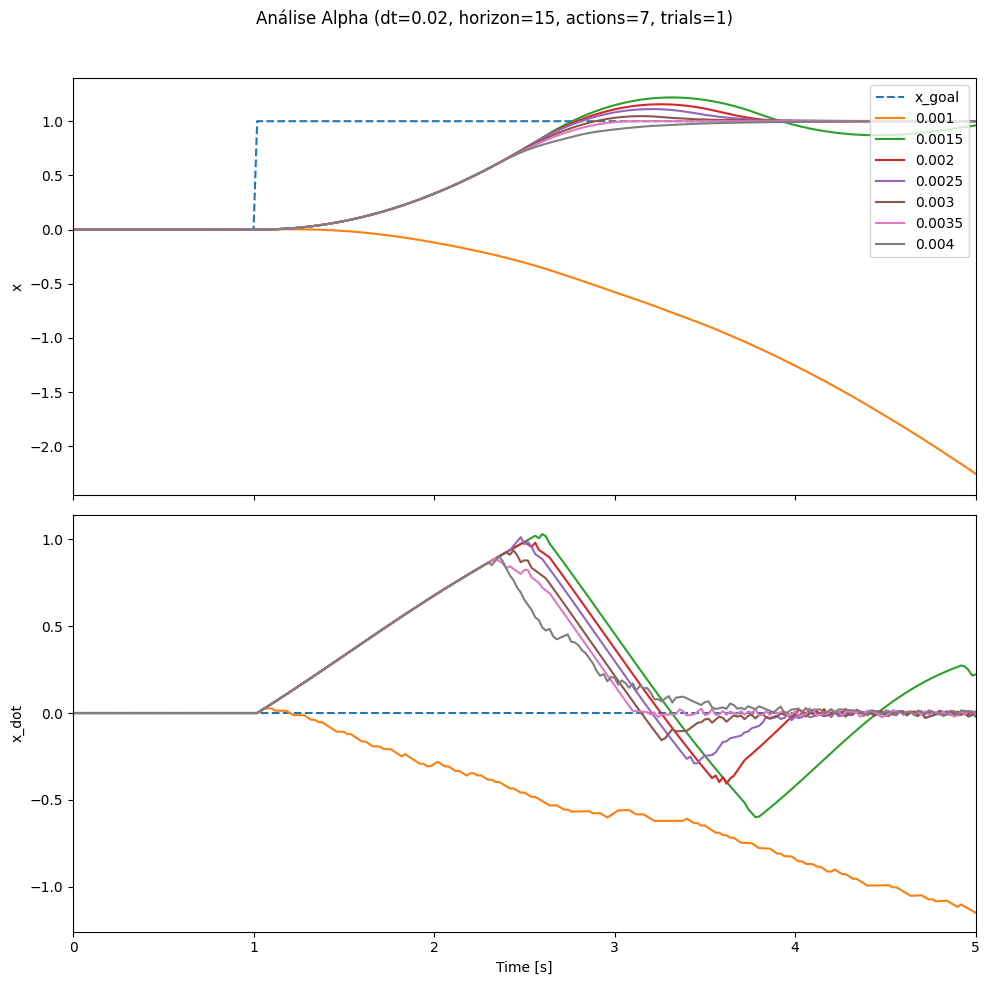

In [27]:
Data = []
L = []

# 1) lê o primeiro CSV para extrair 't' e 'goals' como referência de degrau
#sim0 = read_one('Data/Alpha/2/Alfa1.csv')
#goal_dict = {
#    't': sim0['t'],
#    'states': sim0['goals'],   # para que o degrau apareça também como "state"
#    'goals': sim0['goals']
#}
#Data.append(goal_dict)
#L.append('Goal')

# 2) lê as simulações de Alfa1…Alfa7 (α de 0.001 a 0.004 em passo de 0.0005)
n_alpha = int((0.004 - 0.001) / 0.0005) + 1  # = 7
for i in range(n_alpha):
    idx = i + 1
    alpha_val = round(0.001 + i * 0.0005, 4)
    sim = read_one(f'Data/Alpha/2/Alfa{idx}.csv')
    Data.append(sim)
    L.append(alpha_val)

# 3) gera o gráfico, usando o primeiro item como degrau de meta
Create_1D_Graphic(
    "Análise Alpha (dt=0.02, horizon=15, actions=7, trials=1)",
    L,
    Data
)

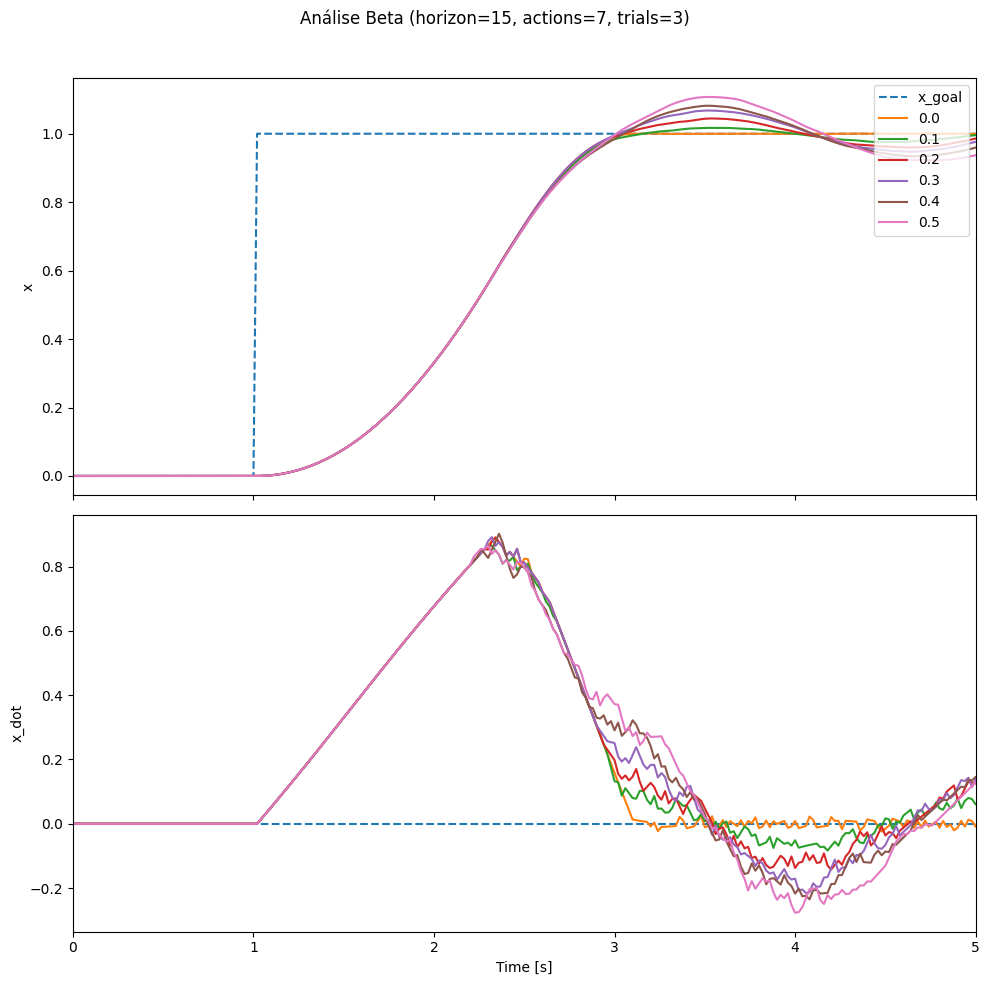

In [83]:
Data = []
L = []

# macro‐sweep de 0.0 a 0.5 em 0.1 → 6 pontos
n_beta = int(0.5 / 0.1) + 1  # = 6
for i in range(n_beta):
    idx = i + 1
    beta_val = round(i * 0.1, 1)
    # lê o CSV gerado pelo simulation: Beta1Data0.csv, …, Beta6Data0.csv
    Data.append(read_one(f'Data/Beta/1/Beta{idx}Data1.csv'))
    L.append(beta_val)

Create_1D_Graphic(
    "Análise Beta (horizon=15, actions=7, trials=3)",L,Data)

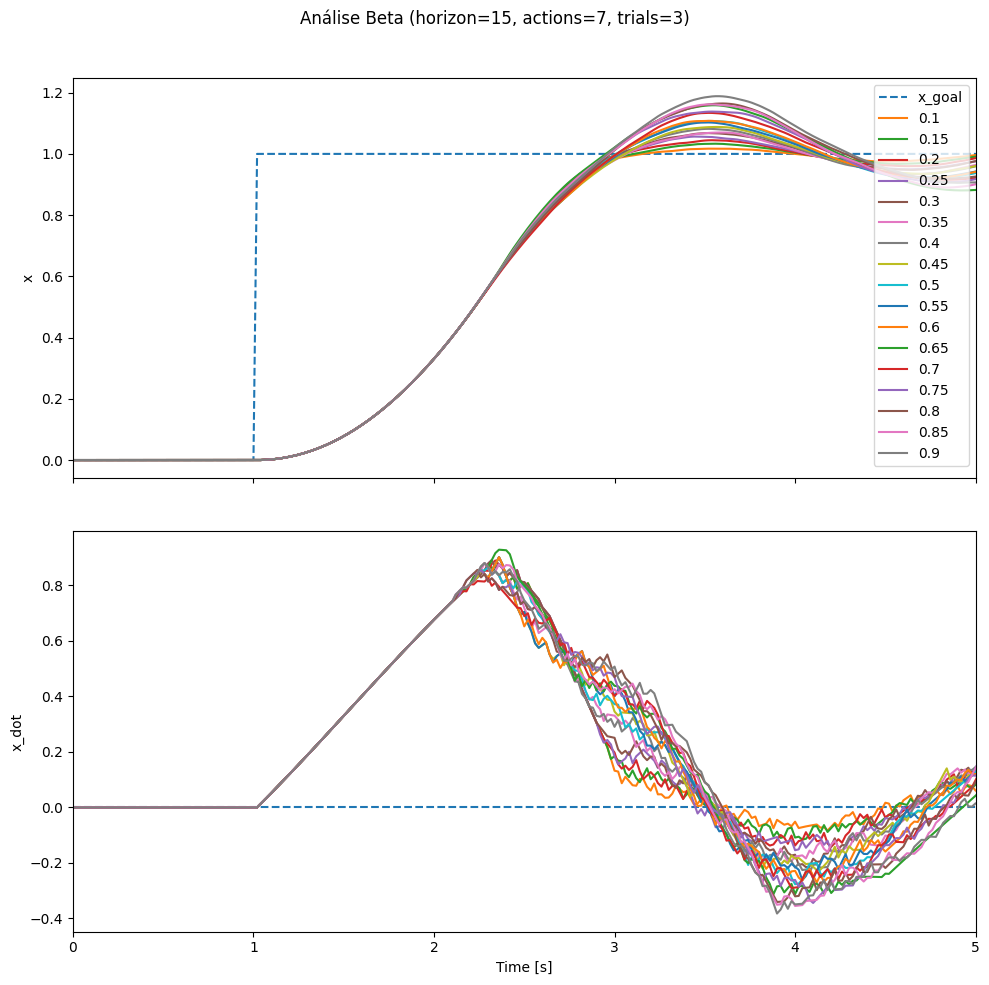

In [57]:
Data = []
L = []

# --- 1) gera o degrau de referência (unit step em t >= 1s) ---
dt = 0.02
max_time = 5.0
t = np.arange(0, max_time + dt/2, dt)
goal = (t >= 1.0).astype(float)

# --- 2) varredura de β de 0.1 até 0.9 em passos de 0.05 ---
n_beta = int((0.9 - 0.1)/0.05) + 1  # = 17 pontos
for i in range(n_beta):
    idx = i + 1
    beta_val = round(0.1 + i * 0.05, 2)
    # lê o CSV: Beta1Data0.csv … Beta17Data0.csv
    Data.append(read_one(f'Data/Beta/2/Beta{idx}Data1.csv'))
    L.append(beta_val)

# --- 3) plota tudo junto, incluindo o degrau ---
Create_1D_Graphic("Análise Beta (horizon=15, actions=7, trials=3)",L,Data)

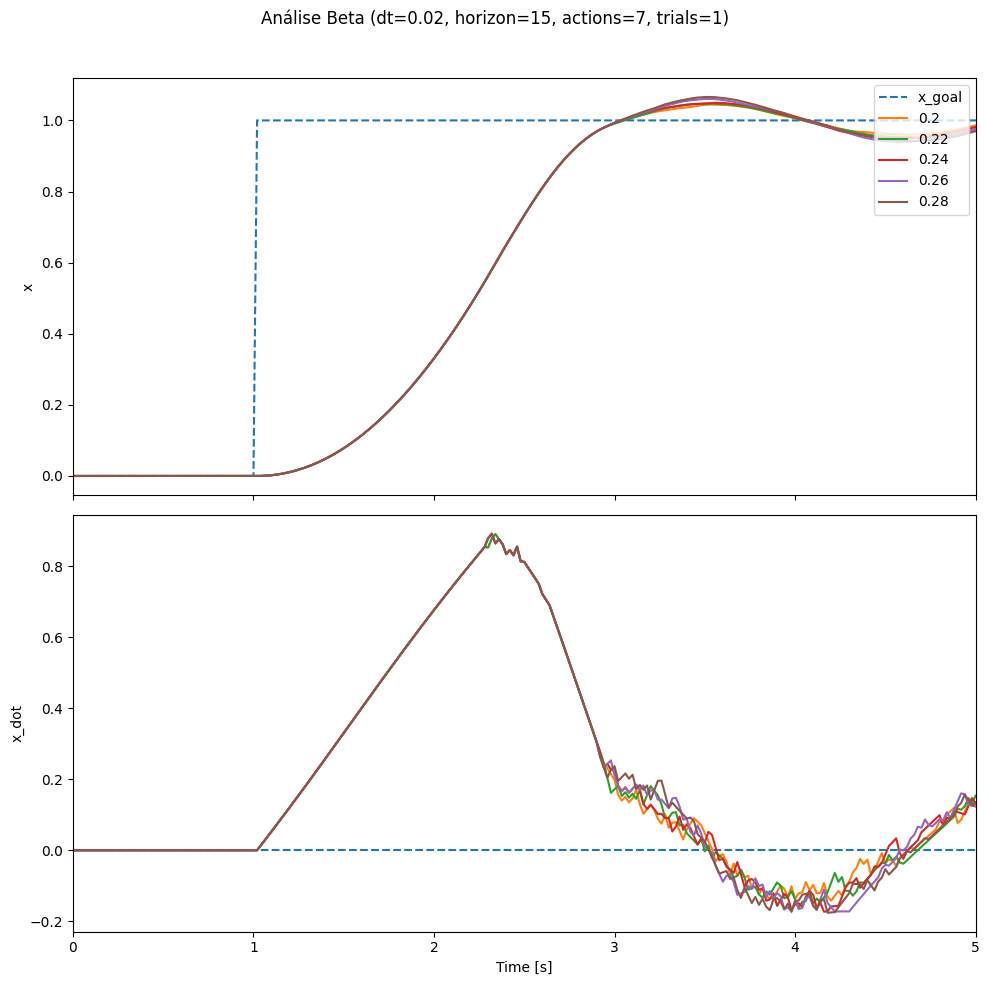

In [ ]:
Data = []
L = []

# Varredura de β: 0.20 ≤ β ≤ 0.30 em passos de 0.02 → 6 pontos
start = 0.20
end   = 0.30
step  = 0.02
n_beta = int((end - start) / step) + 1  # = 6

for i in range(n_beta):
    idx = i + 1
    beta_val = round(start + i * step, 2)
    # lê o CSV gerado pelo modelo: Beta1.csv … Beta6.csv
    Data.append(read_one(f'Data/Beta/3/Beta{idx}Data1.csv'))
    L.append(beta_val)

Create_1D_Graphic(
    "Análise Beta (dt=0.02, horizon=15, actions=7, trials=3)",
    L,
    Data
)


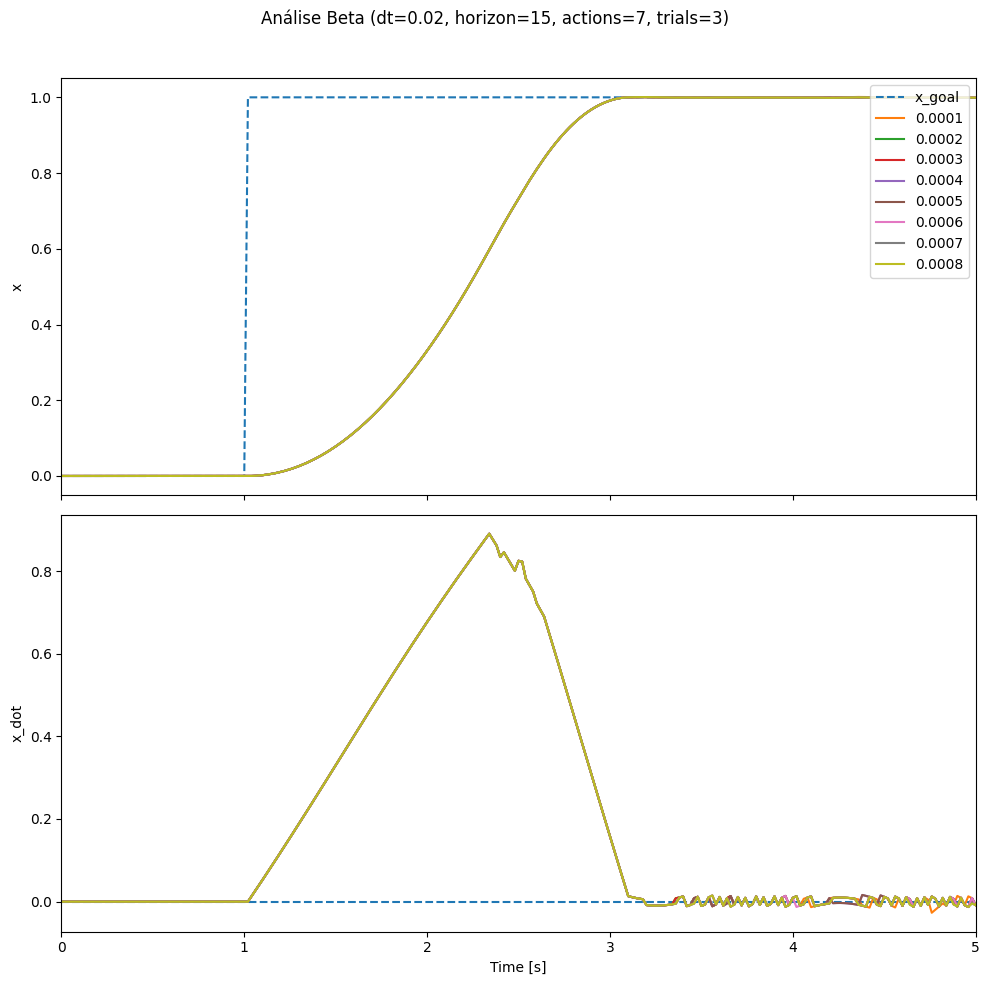

In [85]:
Data = []
L = []

# Varredura de β: 0.0001 ≤ β ≤ 0.002 em passos de 0.0001 → 20 pontos
start  = 0.0001
end    = 0.0009
step   = 0.0001
n_beta = int((end - start) / step) + 1  # = 20

for i in range(n_beta):
    idx      = i + 1
    beta_val = round(start + i * step, 4)
    # lê sempre o primeiro trial (Data0) de cada simulação
    Data.append(read_one(f'Data/Beta/4/Beta{idx}Data2.csv'))
    L.append(beta_val)

Create_1D_Graphic(
    "Análise Beta (dt=0.02, horizon=15, actions=7, trials=3)",
    L,
    Data
)


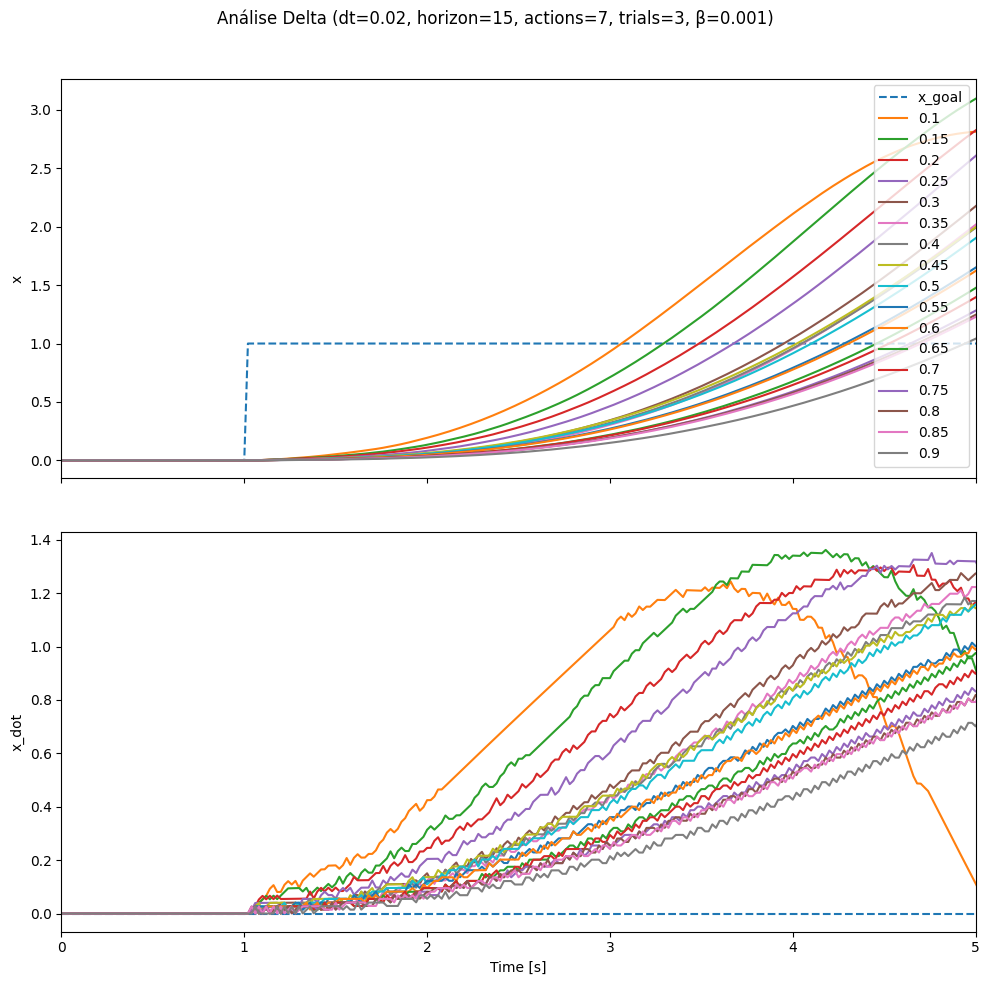

In [67]:
Data = []
L = []
#Beta = 0.5
# Varredura de δ: 0.1 ≤ δ ≤ 0.9 em passos de 0.05 → 17 pontos
start   = 0.1
end     = 0.9
step    = 0.05
n_delta = int((end - start) / step) + 1  # = 17

for i in range(n_delta):
    idx       = i + 1
    delta_val = round(start + i * step, 2)
    # lê sempre o terceiro trial (Data2) de cada simulação
    Data.append(read_one(f'Data/Delta/1/Delta{idx}Data1.csv'))
    L.append(delta_val)

Create_1D_Graphic(
    "Análise Delta (dt=0.02, horizon=15, actions=7, trials=3, β=0.001)",
    L,
    Data
)


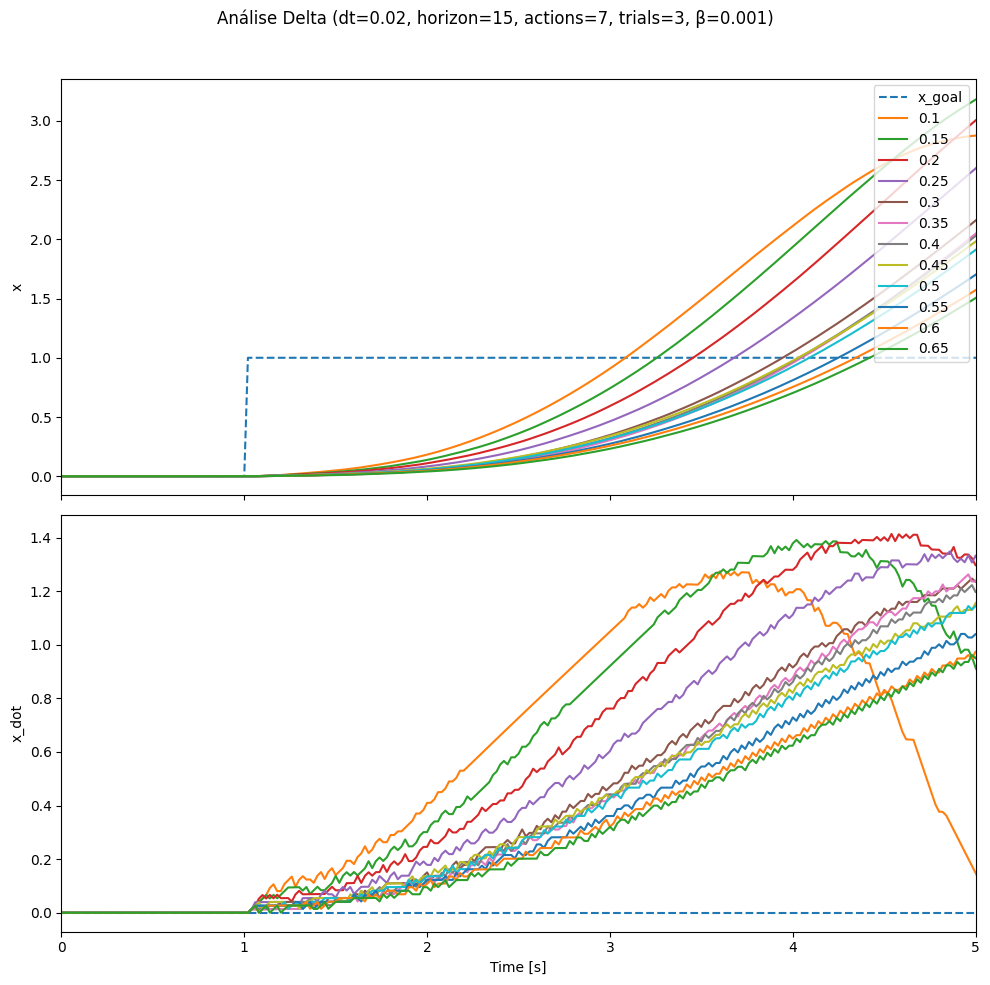

In [ ]:
Data = []
L = []
#Beta = 0.5
# Varredura de δ: 0.1 ≤ δ ≤ 0.65 em passos de 0.05 → 12 pontos
start   = 0.1
end     = 0.65
step    = 0.05
n_delta = int((end - start) / step) + 1  # = 12

for i in range(n_delta):
    idx       = i + 1
    delta_val = round(start + i * step, 2)
    # lê sempre o terceiro trial (Data2) de cada simulação
    Data.append(read_one(f'Data/Delta/2/Delta{idx}Data1.csv'))
    L.append(delta_val)

Create_1D_Graphic(
    "Análise Delta (dt=0.02, horizon=15, actions=7, trials=3, β=0.001)",
    L,
    Data
)


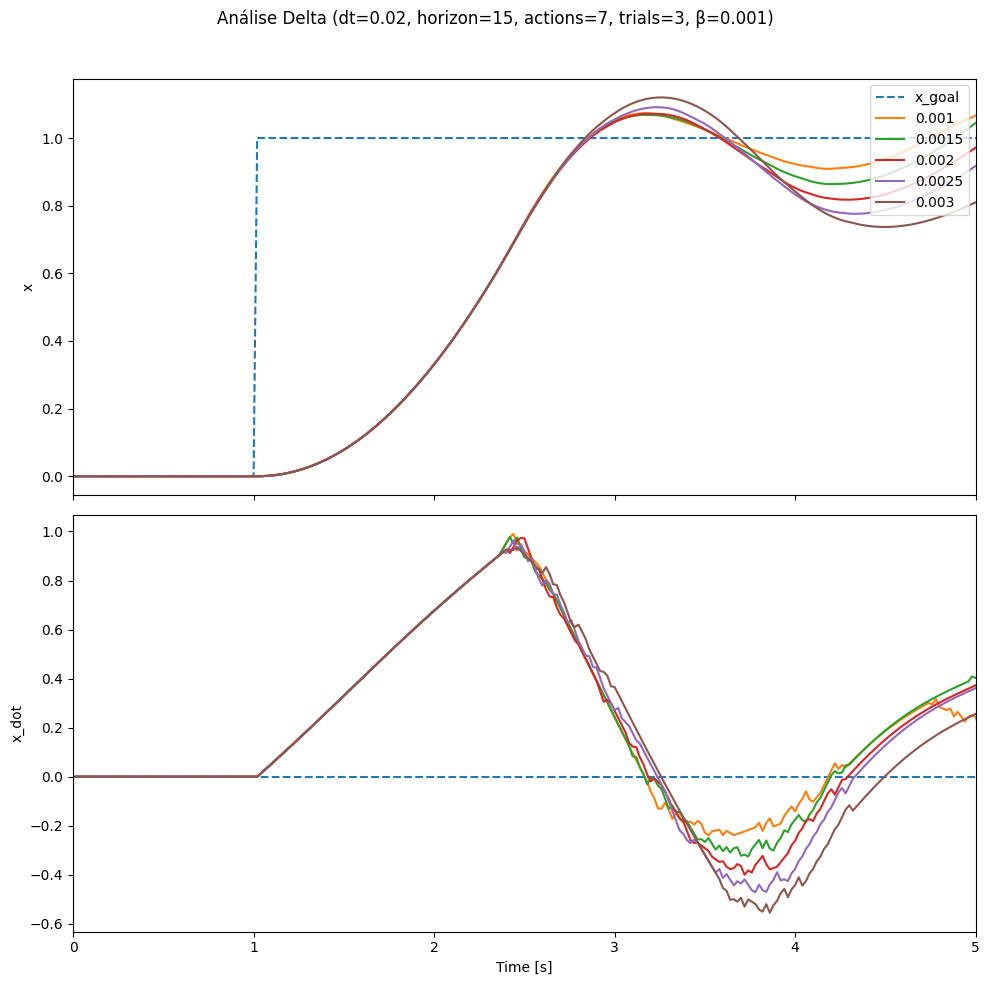

In [77]:
Data = []
L = []

# Varredura de δ: 0.001 ≤ δ ≤ 0.009 em passos de 0.0005 → 17 pontos
start   = 0.001
end     = 0.003
step    = 0.0005
n_delta = int((end - start) / step) + 1  # = 17

for i in range(n_delta):
    idx       = i + 1
    delta_val = round(start + i * step, 4)
    # lê sempre o terceiro trial (Data2) de cada simulação
    Data.append(read_one(f'Data/Delta/3/Delta{idx}Data1.csv'))
    L.append(delta_val)

Create_1D_Graphic(
    "Análise Delta (dt=0.02, horizon=15, actions=7, trials=3, β=0.001)",
    L,
    Data
)


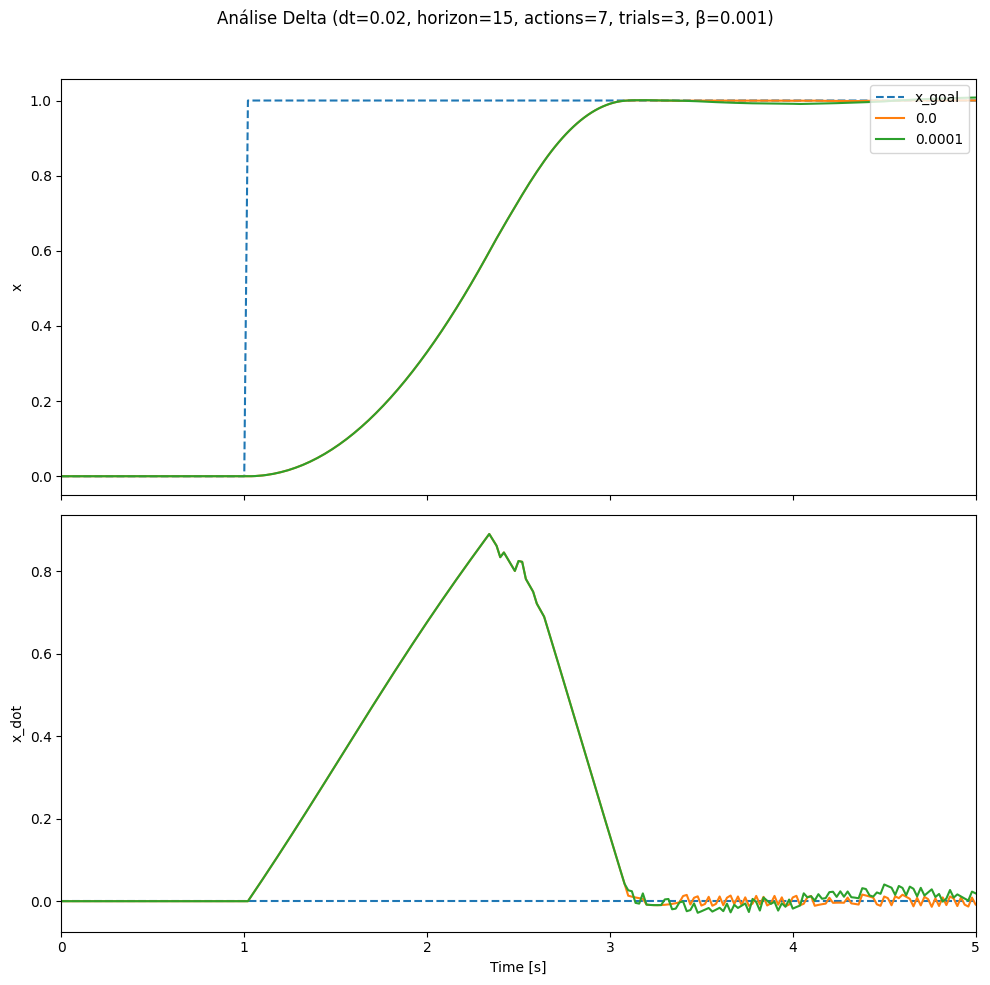

In [81]:
Data = []
L = []

# Varredura de δ: 0.001 ≤ δ ≤ 0.009 em passos de 0.0005 → 11 pontos
start   = 0.000
end     = 0.0001
step    = 0.0001
n_delta = int((end - start) / step) + 1  # = 17

for i in range(n_delta):
    idx       = i + 1
    delta_val = round(start + i * step, 4)
    # lê sempre o terceiro trial (Data2) de cada simulação
    Data.append(read_one(f'Data/Delta/4/Delta{idx}Data1.csv'))
    L.append(delta_val)

Create_1D_Graphic(
    "Análise Delta (dt=0.02, horizon=15, actions=7, trials=3, β=0.001)",
    L,
    Data
)

IndexError: index 0 is out of bounds for axis 0 with size 0

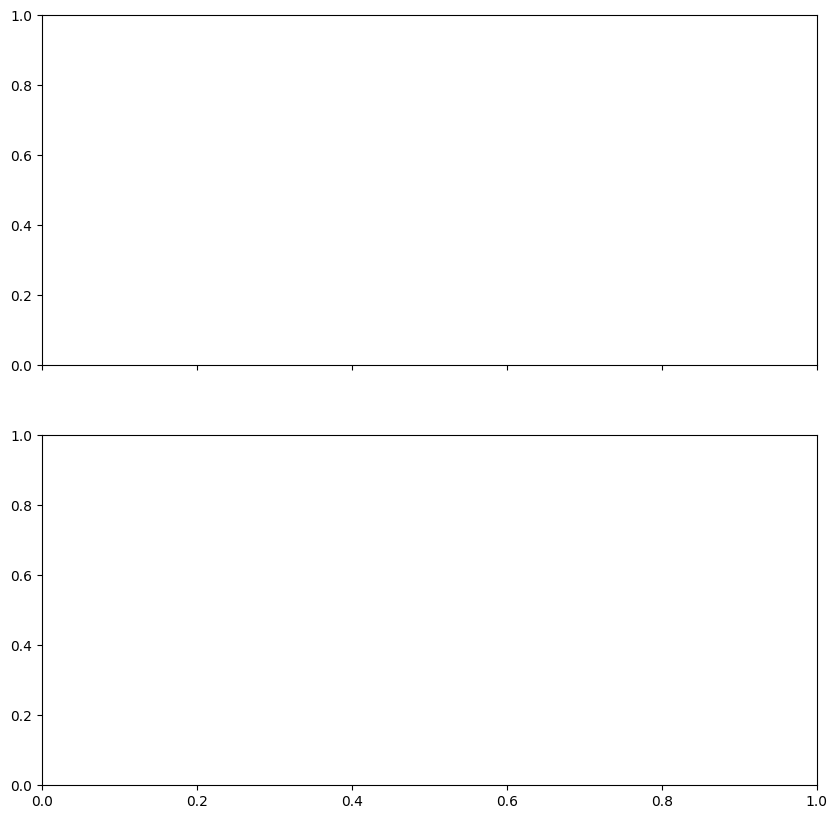

In [42]:
Data = []
L = []
for i in range(21):
    Data.append(read_one(f'Data/Alpha/3/Alphaa{i}Data0.csv'))
    L.append(round(i*0.002,3))

  
Create_1D_Graphic("Analisys alpha 10/11 actinos, no Noise", L, Data) 

IndexError: index 0 is out of bounds for axis 0 with size 0

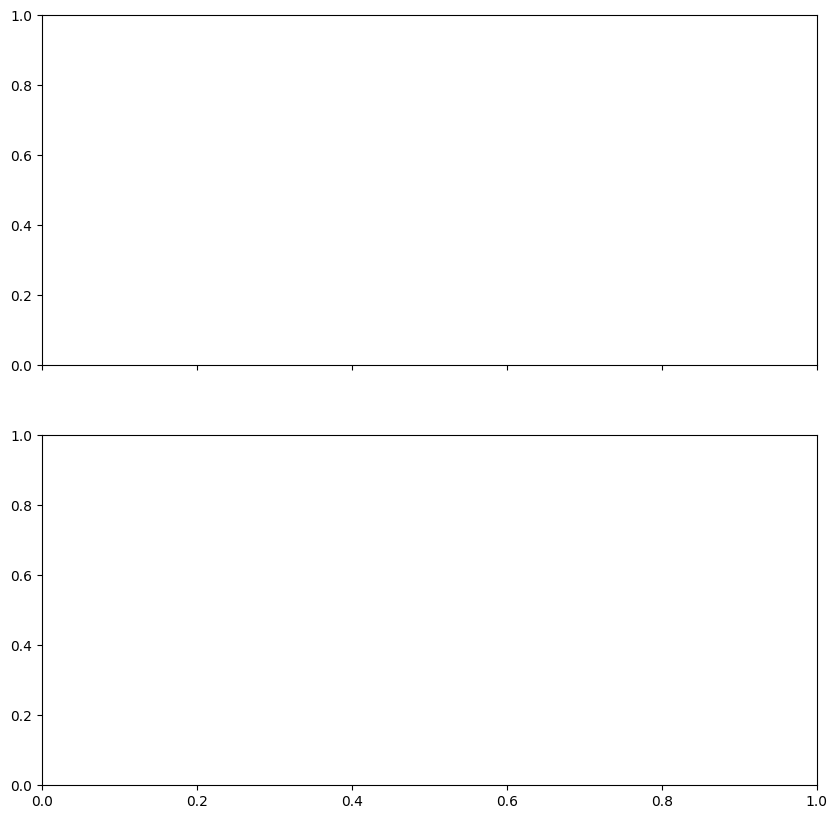

In [ ]:
Data = []
L = []
a = 0.002
for i in range(20):
    Data.append(read_one(f'Data/Alpha/4/Alphaa{i}Data0.csv'))
    L.append(round(a + i*0.0001,4))

  
Create_1D_Graphic("Analisys alpha 10/11 actinos, no Noise", L, Data) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\3709042749.py:58: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


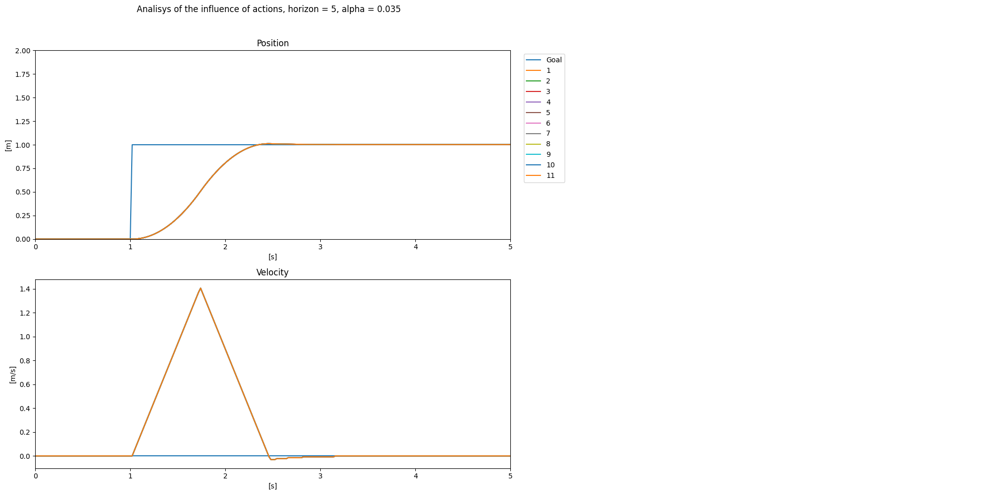

In [ ]:
Data = []
L = []
for i in range(1,12):
    Data.append(read_one(f'Data/Action/actions{i}Data0.csv'))
    L.append(i)

  
Create_1D_Graphic("Analisys of the influence of actions, horizon = 5, alpha = 0.035", L, Data) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\3709042749.py:58: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


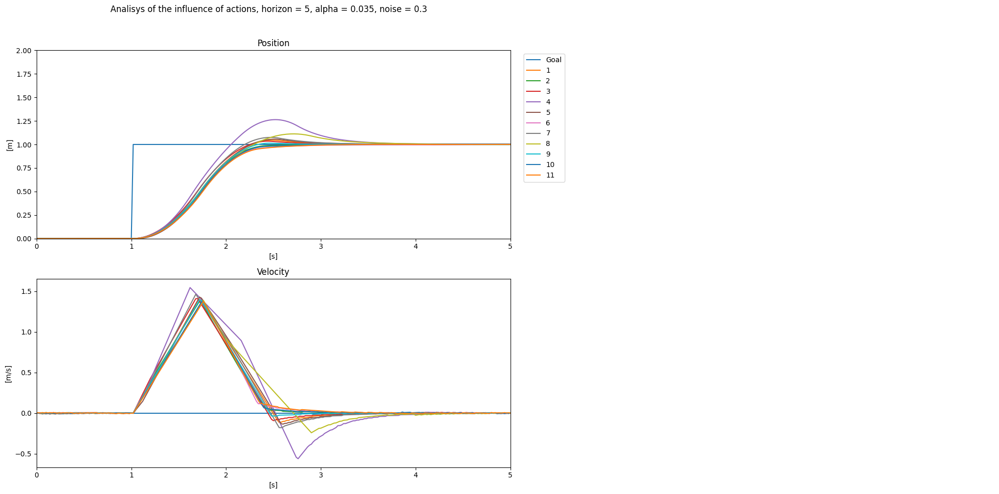

In [ ]:
Data = []
L = []
for i in range(1,12):
    Data.append(read_one(f'Data/Action/2/actionsNoise{i}Data0.csv'))
    L.append(i)

  
Create_1D_Graphic("Analisys of the influence of actions, horizon = 5, alpha = 0.035, noise = 0.3", L, Data) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\2368638484.py:58: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


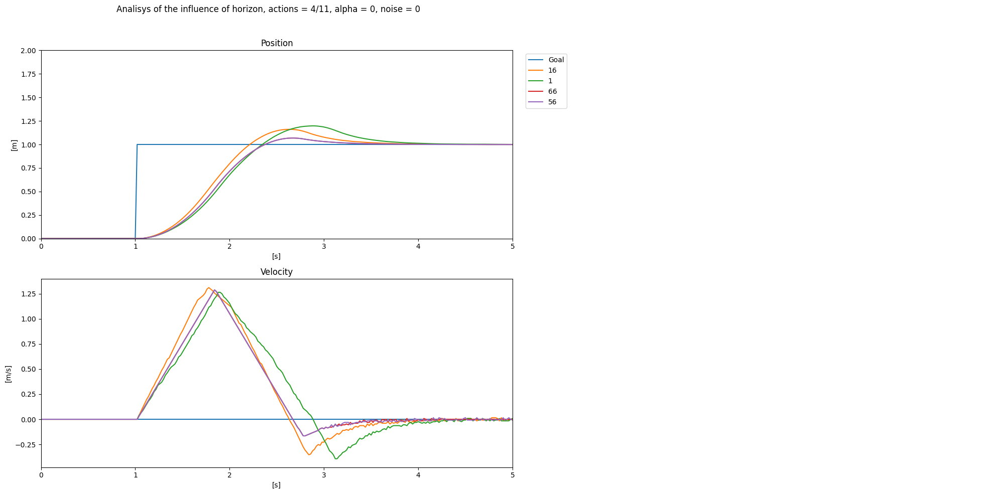

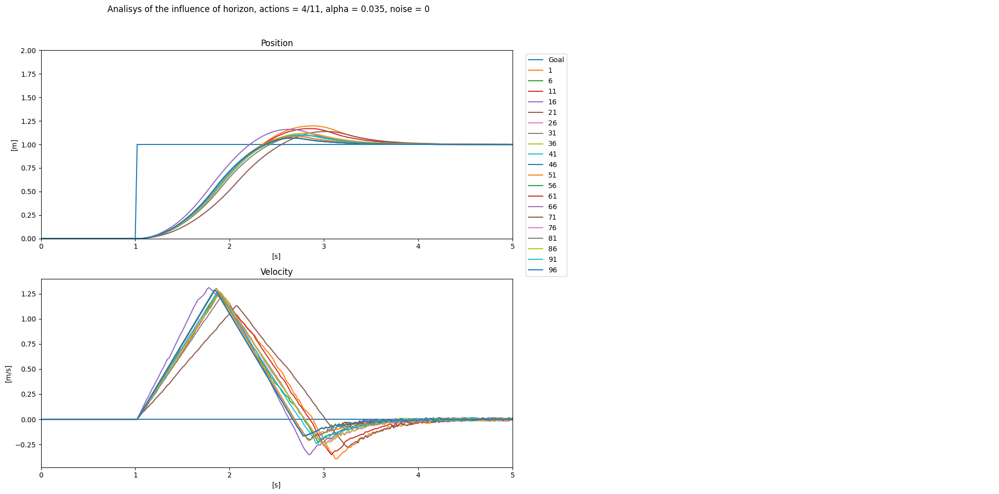

In [ ]:
Data = []
L = []
for i in range(1,100,5):
    Data.append(read_one(f'Data/Horizon/1/Horizon{i}Data0.csv'))
    L.append(i)
Data2 = []
L2 = []
Data2.append(Data[3])
L2.append(L[3])

Data2.append(Data[0])
L2.append(L[0])

Data2.append(Data[13])
L2.append(L[13])

Data2.append(Data[11])
L2.append(L[11])

Create_1D_Graphic("Analisys of the influence of horizon, actions = 4/11, alpha = 0, noise = 0", L2, Data2) 
  
Create_1D_Graphic("Analisys of the influence of horizon, actions = 4/11, alpha = 0.035, noise = 0", L, Data) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1342172975.py:8: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



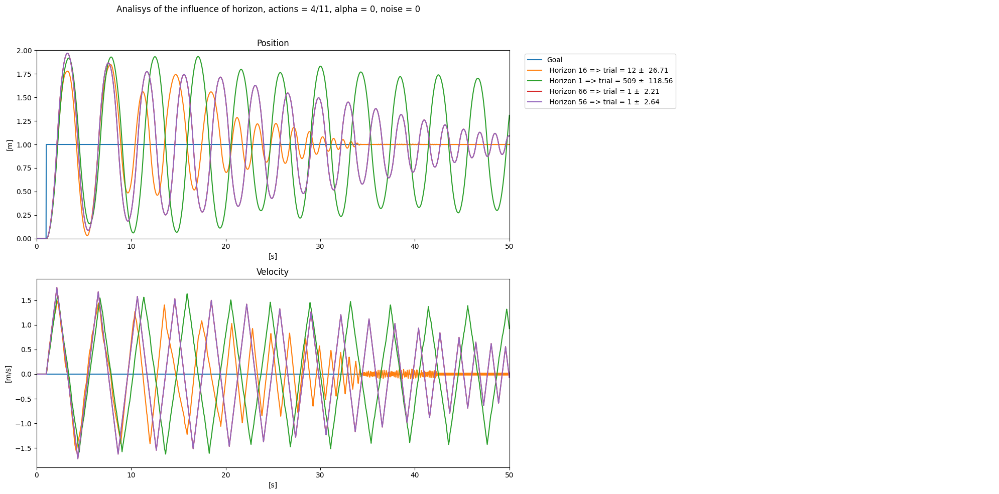

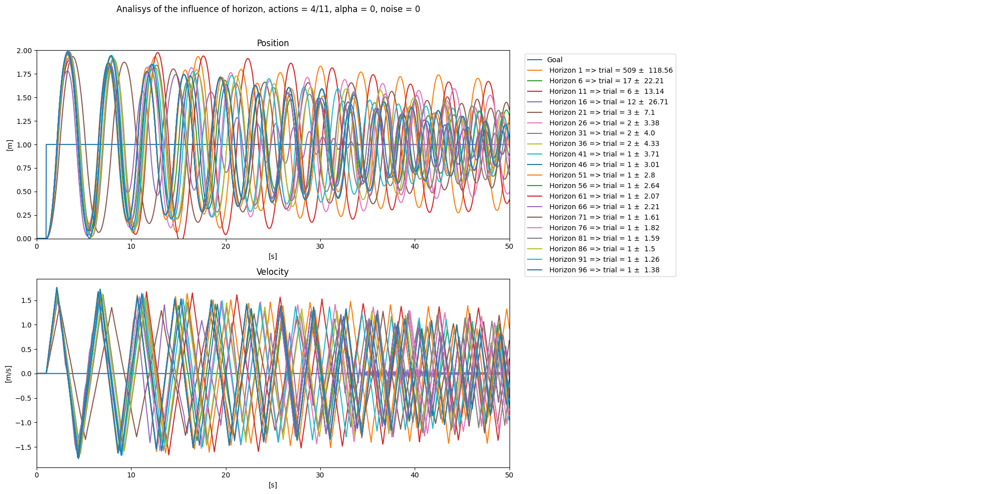

In [ ]:
def Create_1D_Graphic(Title, Subtitle, Data, t):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10), gridspec_kw={'width_ratios': [1,1]})
    axes[0, 0].set_title("Position")
    # axes[0, 1].set_visible(False)  # Remove o gráfico inferior esquerd
    axes[1, 1].set_visible(False)  # Remove o gráfico inferior esquerdo
    axes[1, 0].set_title("Velocity")
    
    axes_right = plt.subplot(1, 2, 2)
    axes_right.axis('off')
    
    axes[0, 0].plot(Data[0][4], Data[0][2])
    axes[1, 0].plot(Data[0][4], Data[0][3])
    axes_right.plot( Data[0][4], Data[0][3],label= "Goal")
    
    
    
    for i, D in enumerate(Data):
        axes[0, 0].plot(D[4], D[0])
        axes[1, 0].plot(D[4], D[1])
        axes_right.plot( D[4], D[1],label=Subtitle[i])
    
    axes_right.legend(loc='upper left', bbox_to_anchor=(0, 1))
    axes[0, 0].set_xlim(0, t)
    axes[0, 0].set_ylim(0, 2)
    axes[0, 0].set_xlabel('[s]')
    axes[0, 0].set_ylabel('[m]')
    
    
    axes[1, 0].set_xlim(0, t)
    axes[1, 0].set_xlabel('[s]')
    axes[1, 0].set_ylabel('[m/s]')
    
    
    axes[0, 1].set_ylim(-2, 2)
    axes_right.set_xlim(-5,-2)
    
    
    
    
    # Terceiro gráfico de legendas
    # axes_legend = fig.add_subplot(2, 2, (3, 4))
    # axes_legend.axis('off')
    # axes_legend.legend(Subtitle, loc='center', title='Legends')
    
    fig.suptitle(Title).set_x(0.27)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ajusta o espaçamento para incluir o terceiro gráfico
    plt.show()
 

Data = []
L = []
Erro =[]
D = []
for i in range(1,100,5):
    D = read_one(f'Data/Horizon/2/Horizon{i}Data0.csv')
    Data.append(D)
    L.append(f' Horizon {i} => trial = {round(np.mean(D[5]))} ±  {round(2*np.std(D[5]), 2)}')

Data2 = []
L2 = [] 
Data2.append(Data[3])
L2.append(L[3])

Data2.append(Data[0])
L2.append(L[0])

Data2.append(Data[13])
L2.append(L[13])

Data2.append(Data[11])
L2.append(L[11])

Create_1D_Graphic("Analisys of the influence of horizon, actions = 4/11, alpha = 0, noise = 0", L2, Data2, 50) 
  
Create_1D_Graphic("Analisys of the influence of horizon, actions = 4/11, alpha = 0, noise = 0", L, Data, 50) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1342172975.py:8: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



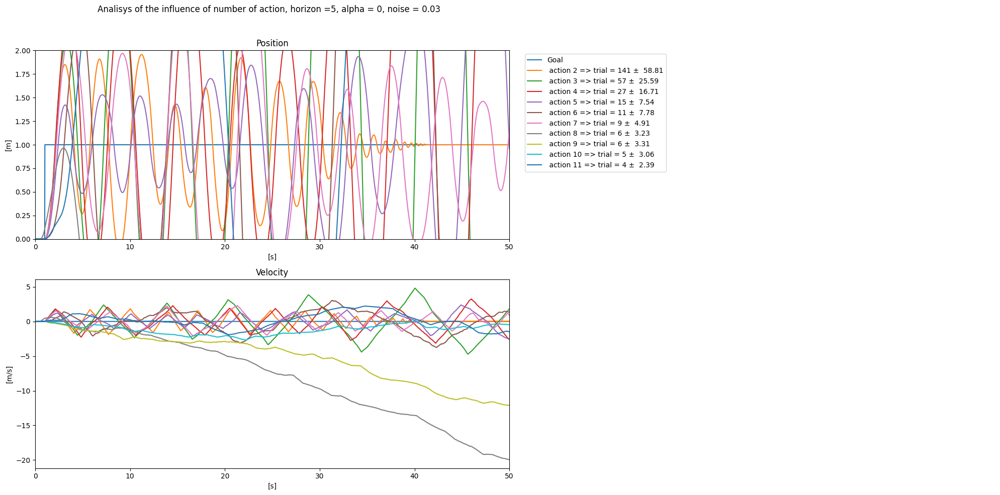

In [ ]:
Data = []
L = []
D = []
for i in range(2,12):
    D = read_one(f'Data/Action/3/actionsNoise53{i}Data0.csv')
    Data.append(D)
    L.append(f' action {i} => trial = {round(np.mean(D[5]))} ±  {round(2*np.std(D[5]), 2)}')
    

  
Create_1D_Graphic("Analisys of the influence of number of action, horizon =5, alpha = 0, noise = 0.03", L, Data, 50) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1342172975.py:8: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



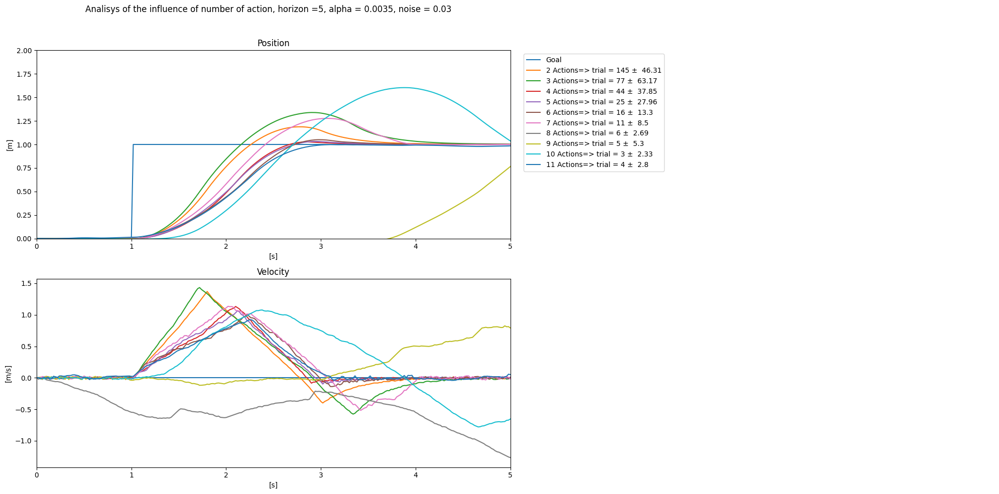

In [ ]:
Data = []
L = []
D = []
for i in range(2,12):
    D = read_one(f'Data/Action/4/actionsNoise4{i}Data0.csv')
    Data.append(D)
    L.append(f'{i} Actions=> trial = {round(np.mean(D[5]))} ±  {round(2*np.std(D[5]), 2)}')
   
    
    


Create_1D_Graphic("Analisys of the influence of number of action, horizon =5, alpha = 0.0035, noise = 0.03", L, Data, 5) 

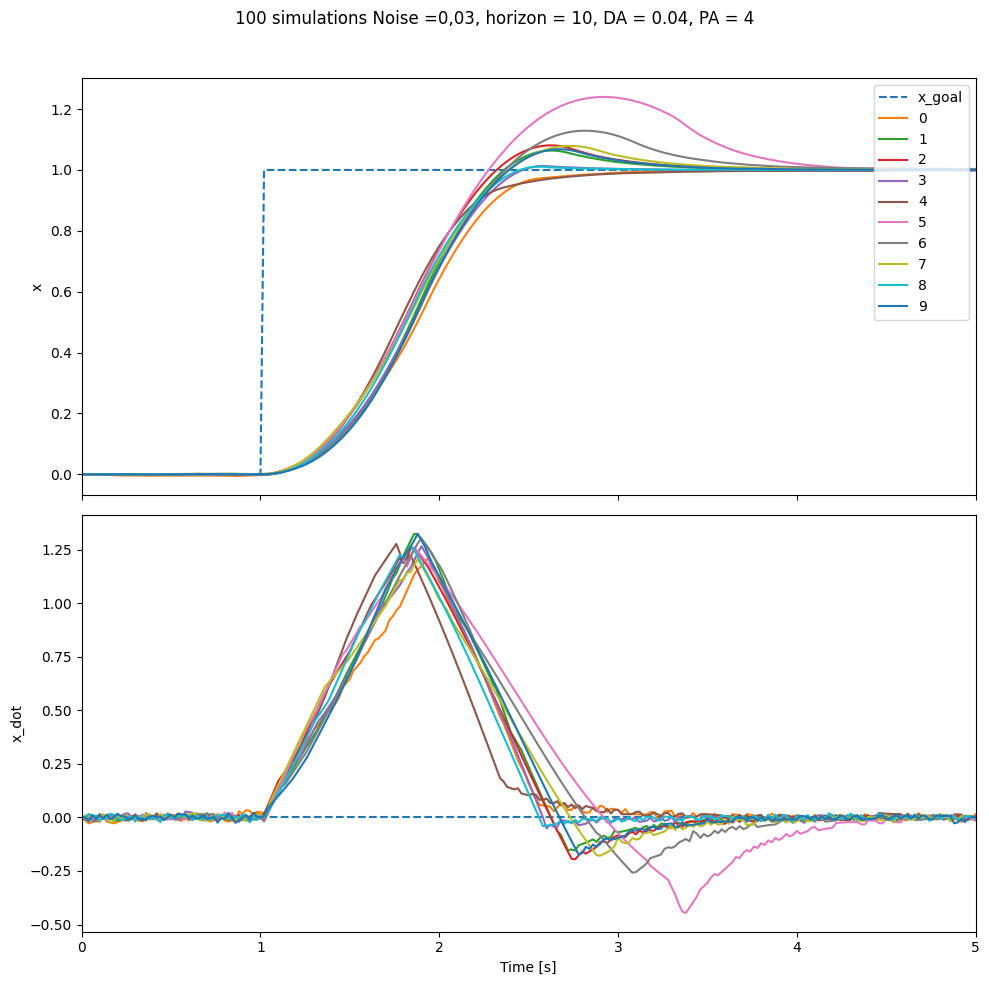

In [68]:
# Defined variables alpha = 0.0035 , horizon =16, actions_possibles = 4;
Data = []
L = []
D = []
for i in range(10):
    D = read_one(f'Data/Unitary/1/UniratyStepData{i}.csv')
    Data.append(D)
    L.append(f'{i}')
   
    
    


Create_1D_Graphic("100 simulations Noise =0,03, horizon = 10, DA = 0.04, PA = 4", L, Data) 

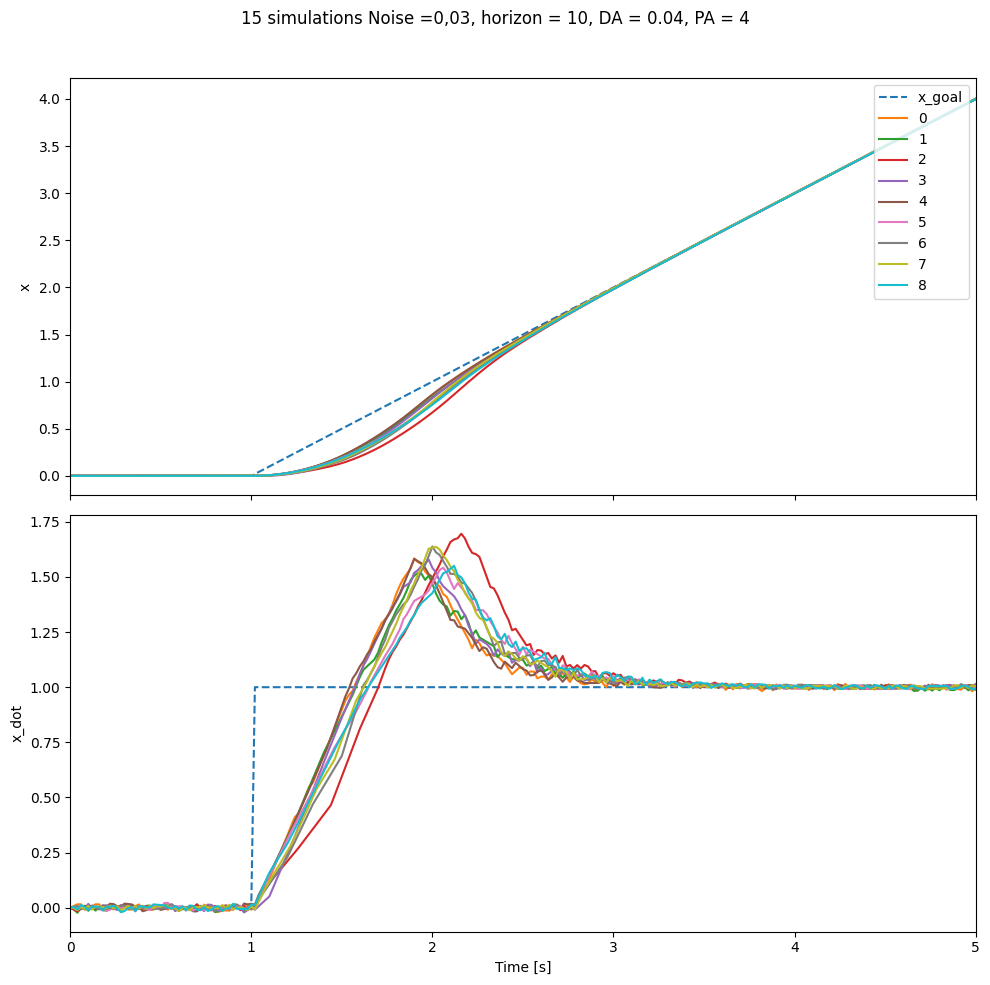

In [69]:
# Defined variables alpha = 0.0035 , horizon =10, actions_possibles = 4;
Data = []
L = []
D = []
for i in range(9):
    D = read_one(f'Data2/Ramp/RampData{i}.csv')
    Data.append(D)
    L.append(f'{i}')
Create_1D_Graphic("15 simulations Noise =0,03, horizon = 10, DA = 0.04, PA = 4", L, Data) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\2095646794.py:107: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



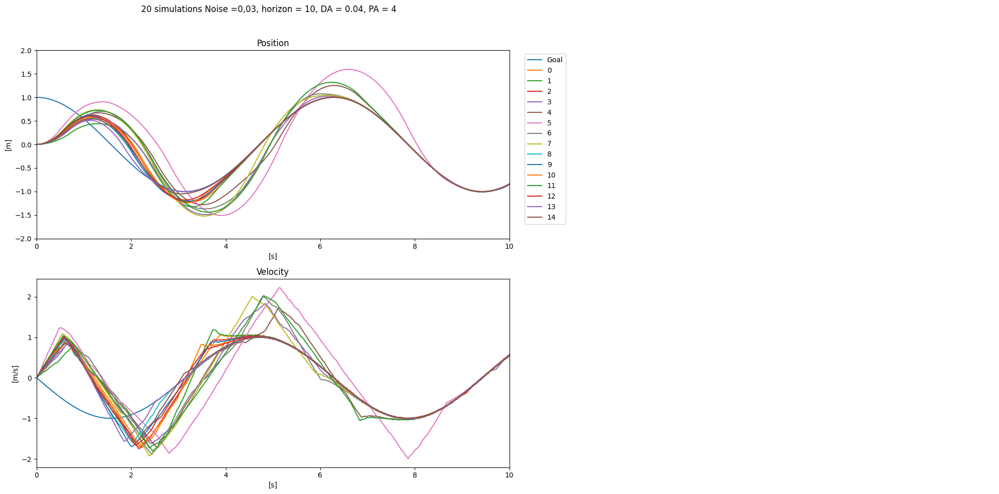

In [ ]:
Data = []
L = []
D = []
for i in range(15):
    D = read_one(f'Data/Cos/Cos15Data{i}.csv')
    Data.append(D)
    L.append(f'{i}')
Create_1D_Graphic2("20 simulations Noise =0,03, horizon = 10, DA = 0.04, PA = 4", L, Data, 10) 

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\2095646794.py:207: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



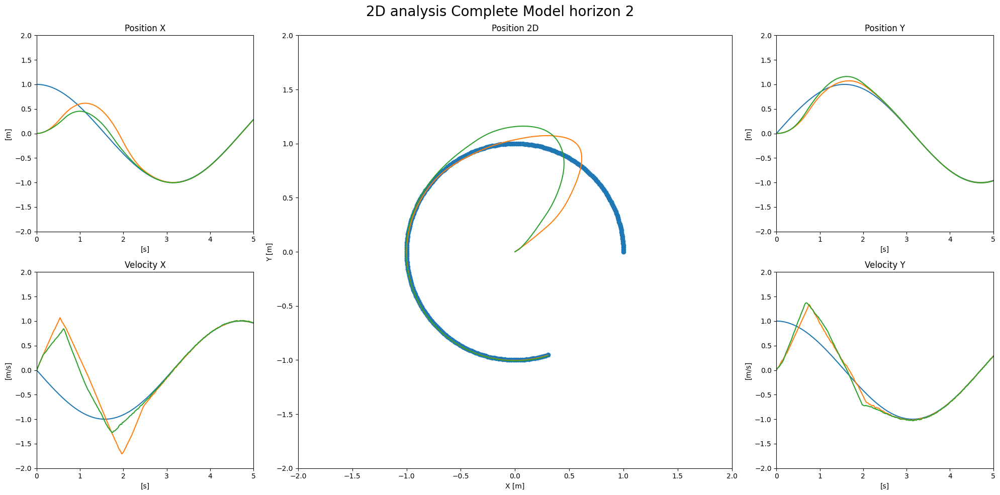

In [ ]:
A = []
L = []
#2DelpticH22Data0.csv
A.append( read_one_2D(f'2DelpticH22Data0.csv'))
A.append( read_one_2D(f'2DelpticH3Data0.csv'))
# A.append( read_one_2D(f'2DelpticH2Data0.csv'))
Create_2D_Graphic("2D analysis Complete Model horizon 2", A, 5)

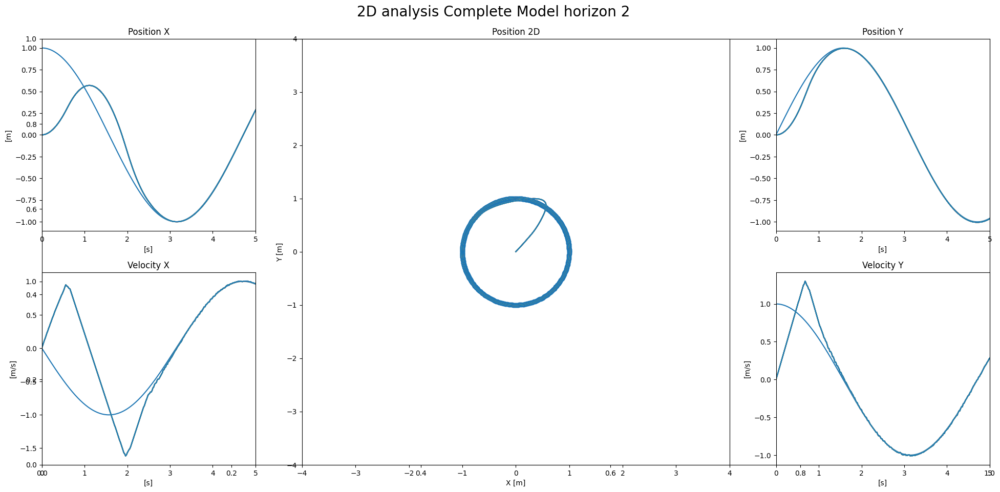

In [ ]:
A = []
L = []
for i in range(2,12):
    A.append( read_one_2D(f'Data2d/ElipticCorr/2DHorizon{i}Data0.csv'))
    


Create_2D_Graphic("2D analysis Complete Model horizon 2", A, 5)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\2095646794.py:207: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



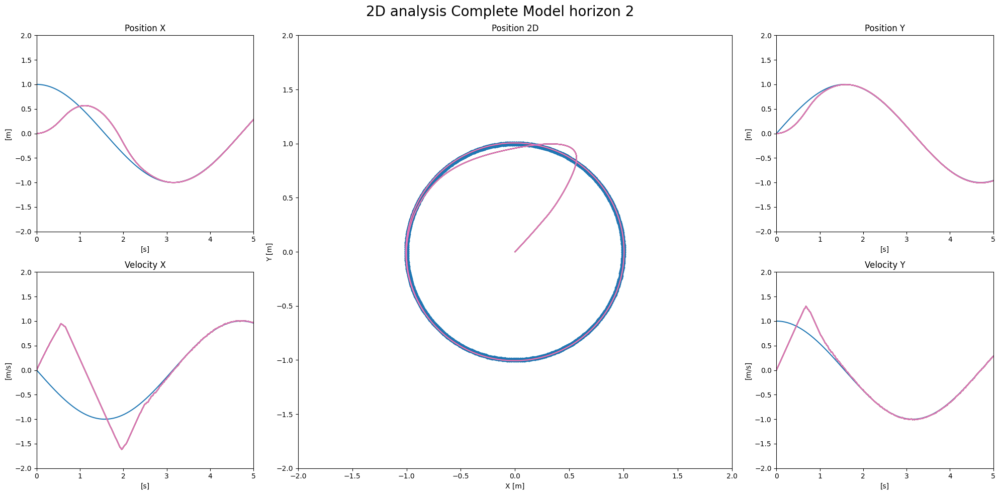

In [ ]:
A = []
L = []
for i in range(2,20,3):
    A.append( read_one_2D(f'Data2d/ElipticCorr/2/2DHorizon{i}Data0.csv'))
    


Create_2D_Graphic("2D analysis Complete Model horizon 2", A, 5)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1126490740.py:51: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


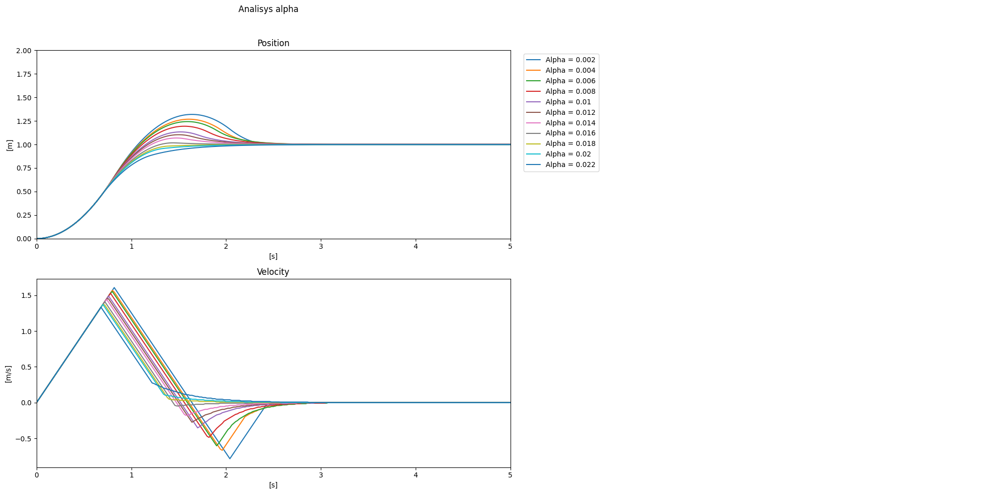

In [ ]:
A = []
L = []
for i in range(11):
    A.append(read_one(f'Data/Alpha3/Alpha1-{i}Data0.csv'))
    L.append(f'Alpha = {round(0.002 + 0.002*i, 4)}')
    
Create_1D_Graphic("Analisys alpha", L, A)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\3649632475.py:147: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


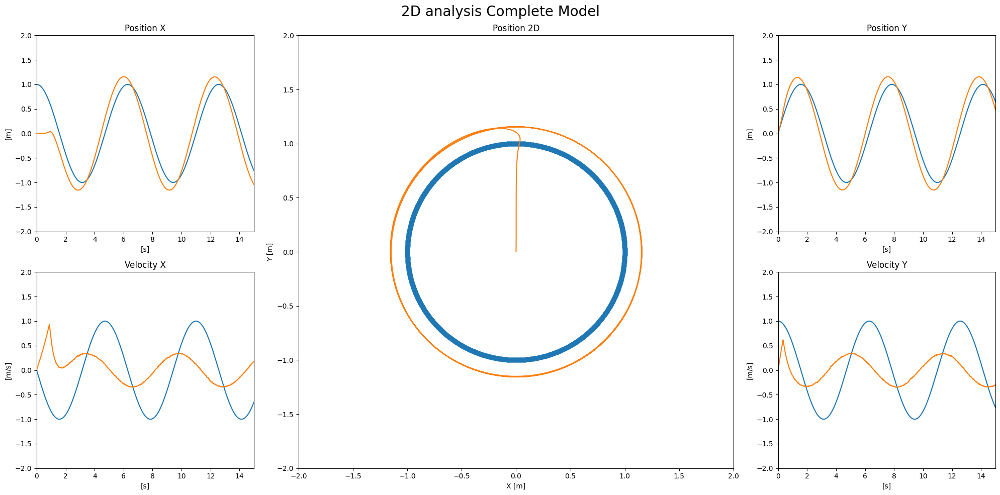

In [ ]:
A = []
L = []
A.append( read_one2D(f'2DelpticData0.csv'))
Create_2D_Graphic("2D analysis Complete Model", A)


C:\Users\marco\AppData\Local\Temp\ipykernel_10432\3649632475.py:147: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


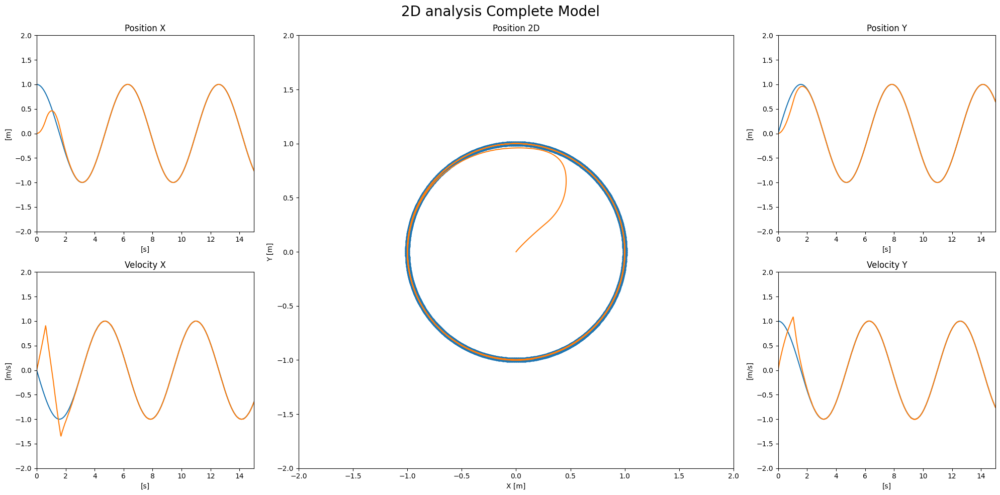

In [ ]:
A = []
L = []
A.append( read_one2D(f'2Delptic2Data0.csv'))
Create_2D_Graphic("2D analysis Complete Model", A)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\3649632475.py:147: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


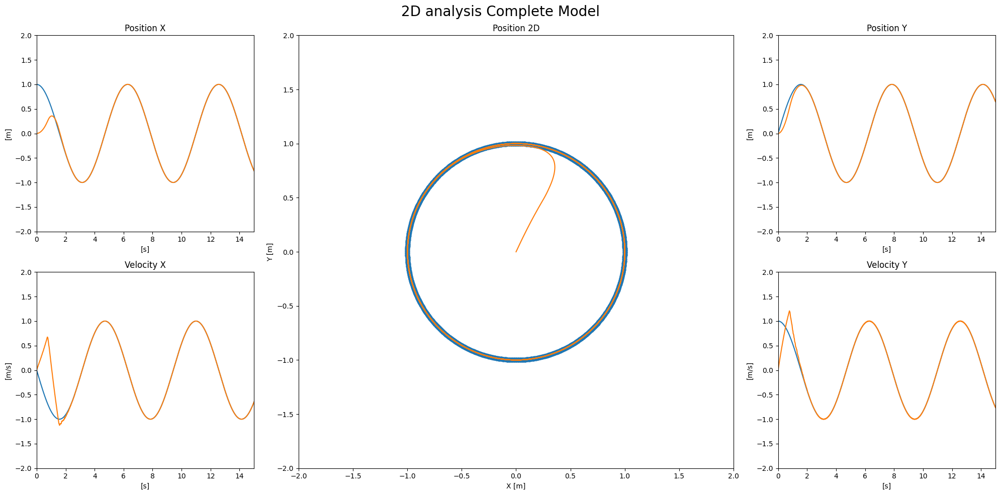

In [ ]:

A = []
L = []
A.append( read_one2D(f'2DelpticAc20D003Data0.csv'))
Create_2D_Graphic("2D analysis Complete Model", A)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1077048202.py:147: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


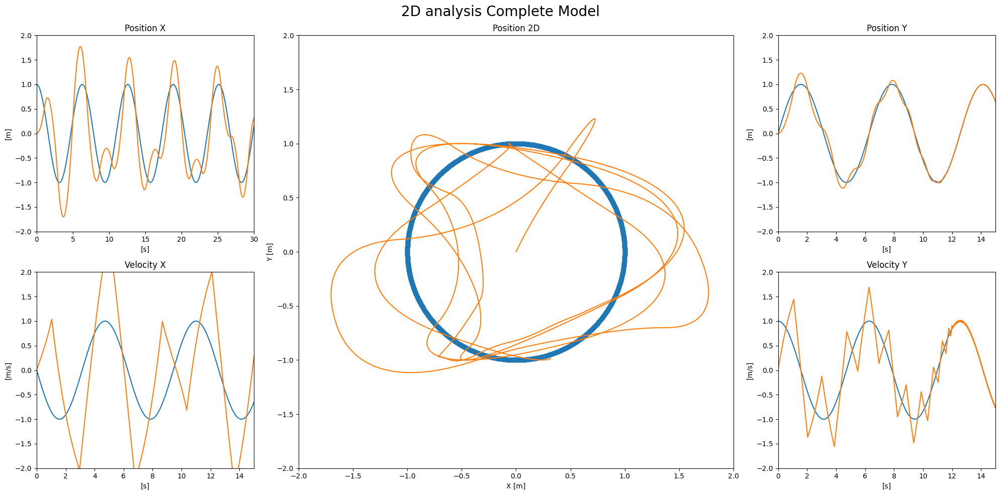

In [ ]:
A = []
L = []
A.append( read_one2D(f'2DelpticAc20D0032Data0.csv'))
Create_2D_Graphic("2D analysis Complete Model", A)

C:\Users\marco\AppData\Local\Temp\ipykernel_10432\1210755662.py:147: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


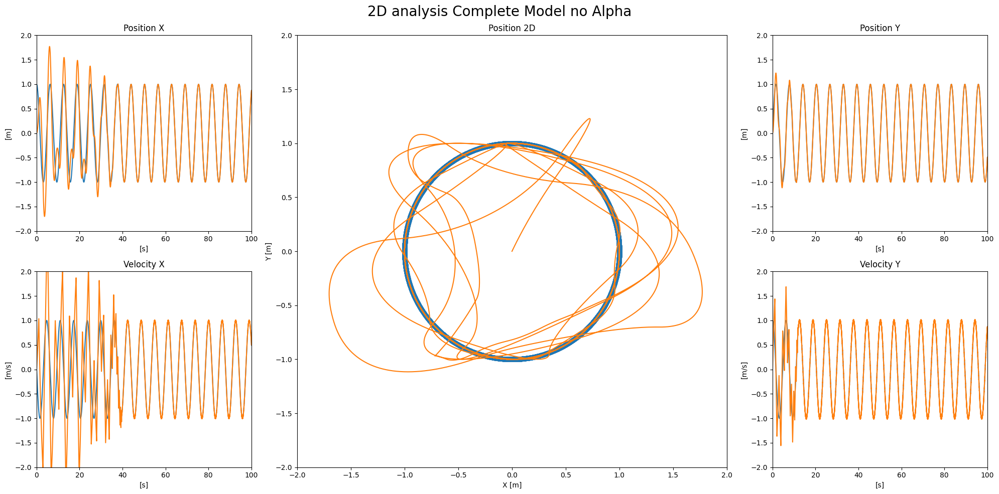

In [ ]:
A = []
L = []
A.append( read_one2D(f'2DelpticAc20D003100Data0.csv'))
Create_2D_Graphic("2D analysis Complete Model no Alpha", A,100)

In [ ]:

def create_animation():
    # Dados iniciais dos pontos
    num_pontos = 100
    posicoes_iniciais = np.random.rand(num_pontos, 2)  # Gerando posições aleatórias

    # Dados do ponto na trajetória circular
    raio = 0.3
    theta = np.linspace(0, 2 * np.pi, num_pontos)[:, np.newaxis]
    posicoes_circulares = np.hstack((raio * np.cos(theta), raio * np.sin(theta)))

    # Criando a figura e o eixo
    fig, ax = plt.subplots()

    # Lista para armazenar os quadros da animação
    quadros = []

    # Lista para armazenar as posições anteriores do ponto circular
    rastro_posicoes_circulares = []

    # Função para atualizar a posição dos pontos a cada quadro da animação
    def atualizar_quadro(frame):
        global posicoes_iniciais

        # Movendo os pontos aleatoriamente
        posicoes_iniciais += np.random.rand(num_pontos, 2) * 0.1

        # Limpando o eixo
        ax.clear()

        # Plotando os pontos atualizados
        ax.scatter(posicoes_iniciais[:, 0], posicoes_iniciais[:, 1])

        # Plotando o ponto na trajetória circular
        ponto_circular = posicoes_circulares[frame % num_pontos]
        ax.scatter(ponto_circular[0], ponto_circular[1], color='red')

        # Adicionando a posição atual do ponto circular ao rastro
        rastro_posicoes_circulares.append(ponto_circular)

        # Plotando o rastro das posições anteriores do ponto circular
        rastro = np.array(rastro_posicoes_circulares)
        ax.plot(rastro[:, 0], rastro[:, 1], 'gray', alpha=0.3)

        # Definindo limites do eixo para manter os pontos visíveis
        ax.set_xlim(-0.5, 0.5)
        ax.set_ylim(-0.5, 0.5)
        
        
        ax.set_title("2D Analysis")
        ax.text(0.6, 0.7, f'Quadro: {frame}', transform=ax.transAxes, fontsize=12)

        # Salvando o quadro como imagem
        fig.canvas.draw()
        imagem = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        imagem = imagem.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        quadros.append(Image.fromarray(imagem))

    # Criando a animação
    animacao = FuncAnimation(fig, atualizar_quadro, frames=200, interval=50)

    # Salvando a animação como um arquivo GIF
    animacao.save('animacao2.gif', writer='pillow', fps=30)

    # Exibindo a animação
    plt.show()

In [ ]:

def create_animation(Data,Title, Subtitle, name):
    # Dados iniciais dos pontos
    
    # Criando a figura e o eixo
    fig, ax = plt.subplots()

    # Lista para armazenar os quadros da animação
    quadros = []

     # Gerando cores aleatórias para cada curva
    cores = [(random.random(), random.random(), random.random()) for _ in range(len(Data))]

    # Função para atualizar a posição dos pontos a cada quadro da animação
    def atualizar_quadro(frame):
        nonlocal Data, cores
        # Limpando o eixo
        ax.clear()
        posicao_x = Data[0][4][:frame+1]
        posicao_y = Data[0][6][:frame+1]
        t = Data[0][8][:frame+1]
        # ax.plot(posicao_x, posicao_y, color='blue', alpha=1)
        ax.text(0.02, 0.95, f'Tempo: {t[-1]} s', transform=ax.transAxes, verticalalignment='top')

            # Plotando o ponto atual
        ax.scatter(posicao_x[-1], posicao_y[-1],marker='o', color = 'blue', label = 'Goal')
        
        
        # Atualizando os pontos no gráfico
        for sub, posicao, c in zip(Subtitle,Data, cores):
            posicao_x = posicao[0][:frame+1]
            posicao_y = posicao[2][:frame+1]
            
            # Plotando o rastro do ponto
            ax.plot(posicao_x, posicao_y, color = c, alpha=0.3)

            # Plotando o ponto atual
            ax.scatter(posicao_x[-1], posicao_y[-1], marker='3',color = c, s = 100, label = sub)
            

        # Definindo limites do eixo para manter os pontos visíveis
        ax.set_xlim(-4, 4)
        ax.set_ylim(-4, 4)
        ax.set_xlabel("x [m]")
        ax.set_ylabel("y [m]")
        # Adicionando título
        ax.set_title(Title)
        
    
        ax.legend()

        # Salvando o quadro como imagem
        fig.canvas.draw()
        imagem = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        imagem = imagem.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        quadros.append(Image.fromarray(imagem))

# Função para adicionar uma nova posição ao conjunto de dados
    def adicionar_posicao(posicao):
        global Data
        Data.append(posicao)


    # Criando a animação
    animacao = FuncAnimation(fig, atualizar_quadro, frames=len(Data[0][1]), interval=20)

    # Salvando a animação como um arquivo GIF
    animacao.save(f'{name}.gif', writer='pillow', fps=30)

    # Exibindo a animação
    plt.show()

In [ ]:
A = []
L = []
L.append("teste")
A.append( read_one_2D(f'2DelpticH2Data0.csv'))
create_animation(A,'2D anlysis' , L, 'Teste')

FileNotFoundError: [Errno 2] No such file or directory: '2DelpticH2Data0.csv'

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\4282707676.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


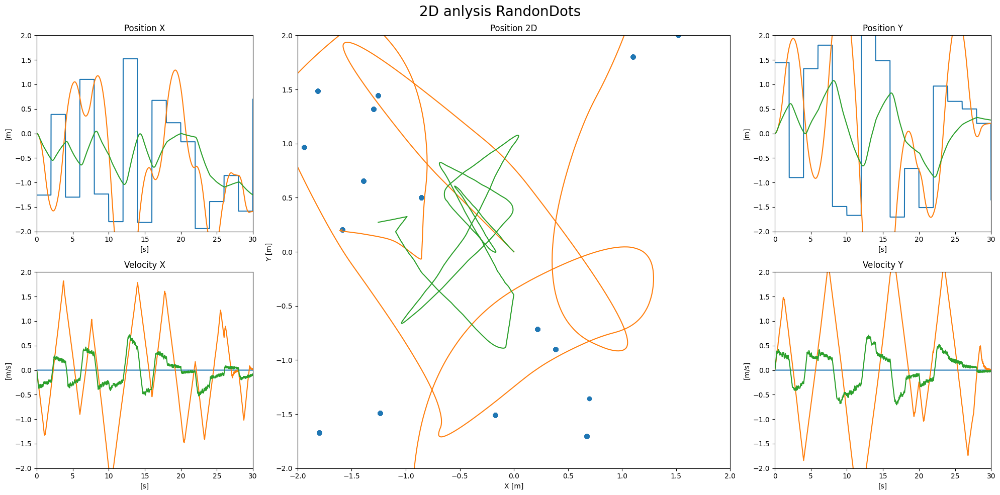

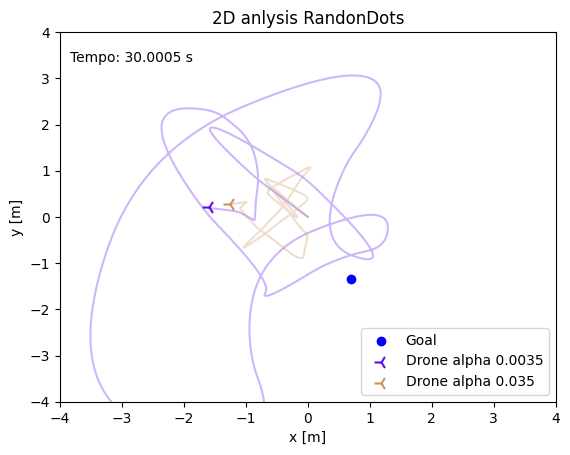

In [ ]:

A = []
L = []
L.append("Drone alpha 0.0035")
A.append( read_one_2D(f'2DalData0.csv'))
L.append("Drone alpha 0.035")
A.append( read_one_2D(f'2Dal2Data0.csv'))

Create_2D_Graphic('2D anlysis RandonDots', A, 30)

create_animation(A,'2D anlysis RandonDots' , L, 'Randon')

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\4282707676.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


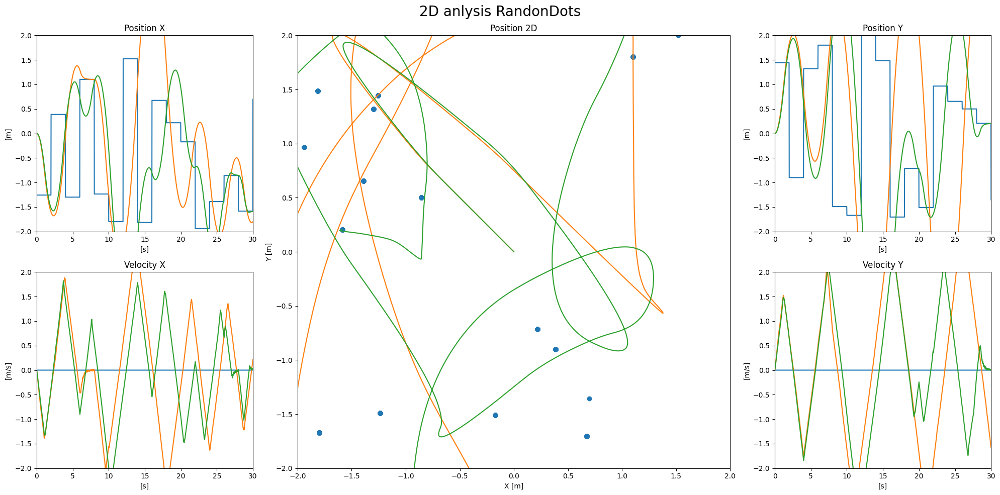

In [ ]:
A = []
L = []
L.append("Drone no Go alpha 0.0035")
A.append( read_one_2D(f'2Dal2NoGoData0.csv'))
L.append("Drone alpha 0.0035")
A.append( read_one_2D(f'2DalData0.csv'))


Create_2D_Graphic('2D anlysis RandonDots', A, 30)



C:\Users\marco\AppData\Local\Temp\ipykernel_21176\4282707676.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


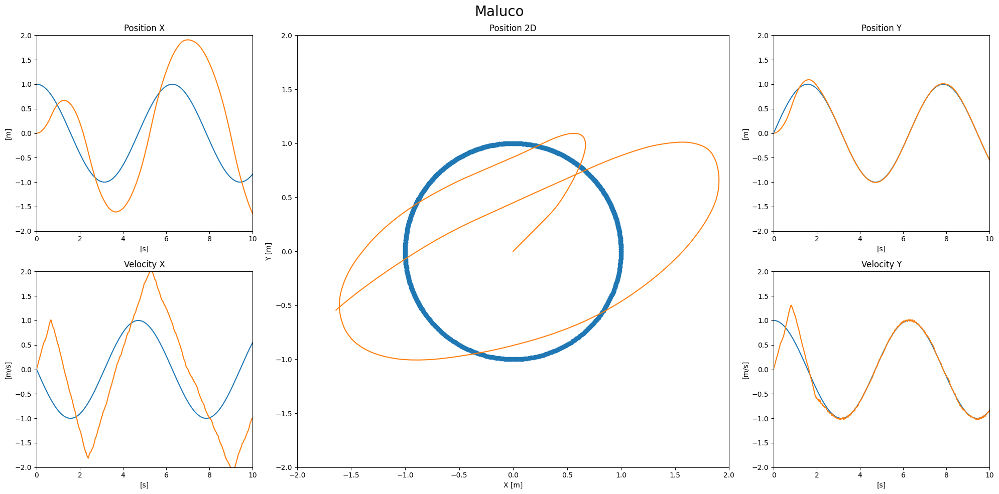

In [ ]:

A = []
L = []
L.append("teste")
# A.append( read_one_2D(f'2DelpticH2Data0.csv'))
# A.append( read_one_2D(f'2DelpticH4Data0.csv'))
A.append( read_one_2D(f'2DHorizonNoGo5Data0.csv'))

Create_2D_Graphic("Maluco", A, 10)
# create_animation(A, L, 10, f'teste.gif')


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\4144824331.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


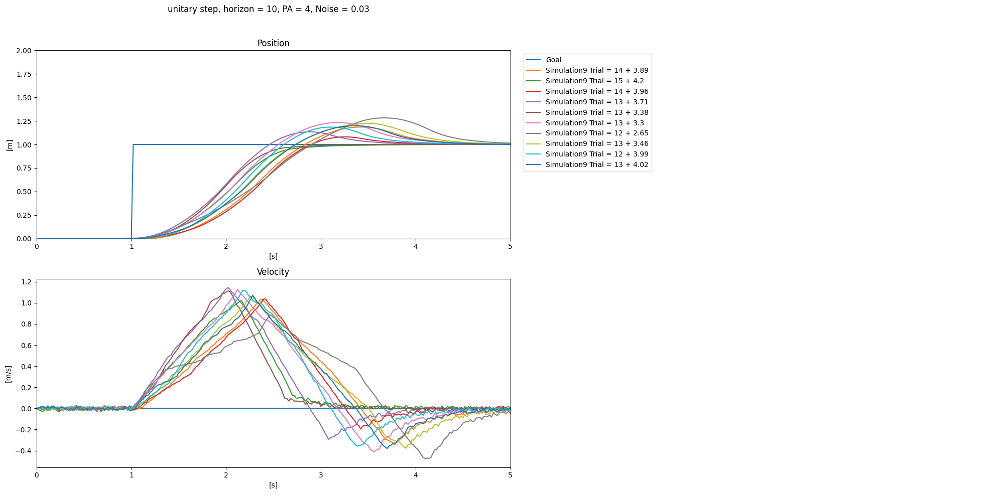

In [ ]:
A = []
L = []
for i in range(10):
    A.append(read_one(f'Data2/UnitaryStep/UniratyStepData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'unitary step, horizon = 10, PA = 4, Noise = 0.03' 
Create_1D_Graphic(title, L, A)  

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2269886804.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


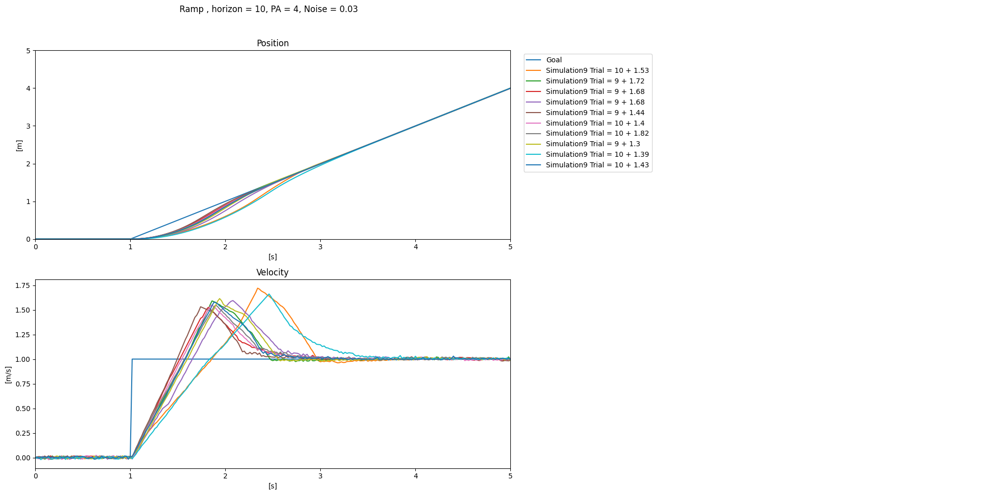

In [ ]:
A = []
L = []
for i in range(10):
    A.append(read_one(f'Data2/Ramp/RampData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'Ramp , horizon = 10, PA = 4, Noise = 0.03' 
Create_1D_Graphic(title, L, A)  

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\1093935635.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


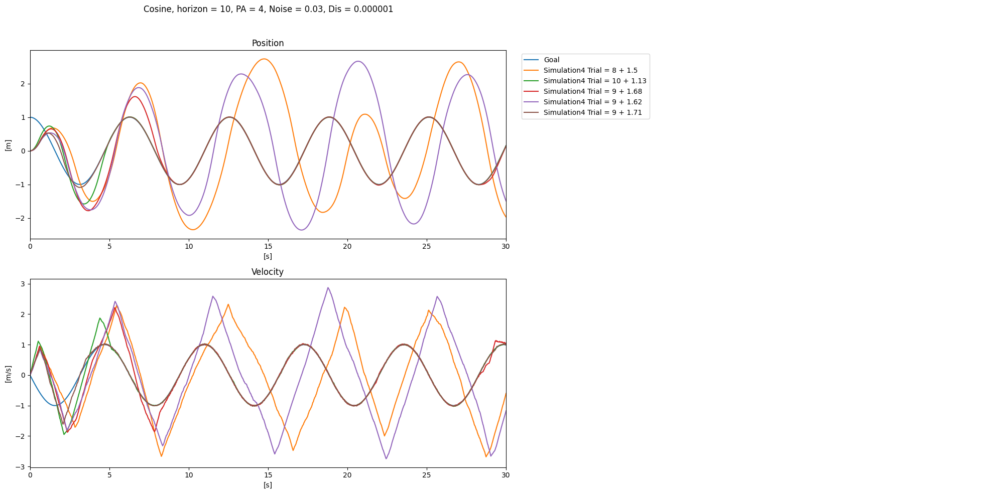

In [ ]:

A = []
L = []
for i in range(5):
    A.append(read_one(f'Data2/Cos/Cos1Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'Cosine, horizon = 10, PA = 4, Noise = 0.03, Dis = 0.000001' 
Create_1D_Graphic(title, L, A)  

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


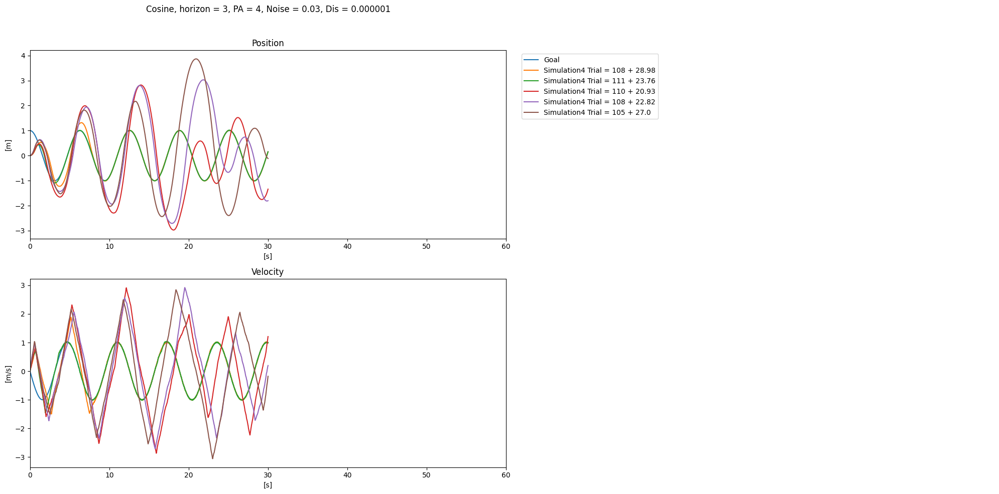

In [ ]:
A = []
L = []
for i in range(5):
    A.append(read_one(f'Data2/Cos2/Cos1H3Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'Cosine, horizon = 3, PA = 4, Noise = 0.03, Dis = 0.000001' 
Create_1D_Graphic(title, L, A)  

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


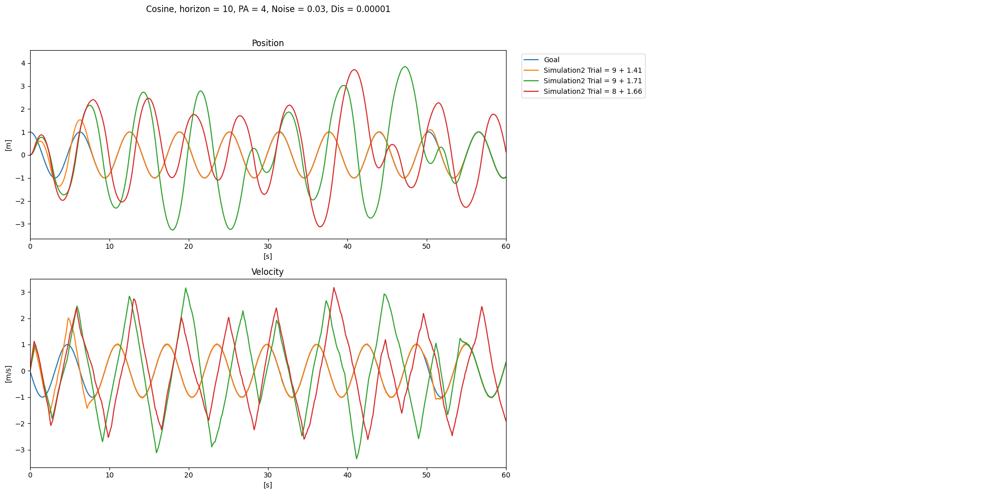

In [ ]:
A = []
L = []
for i in range(3):
    A.append(read_one(f'Data2/Cos3/Cos1H3Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'Cosine, horizon = 10, PA = 4, Noise = 0.03, Dis = 0.00001'
Create_1D_Graphic(title, L, A)  

C:\Users\marco\AppData\Local\Temp\ipykernel_21176\1832283888.py:63: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_right = plt.subplot(1, 2, 2)


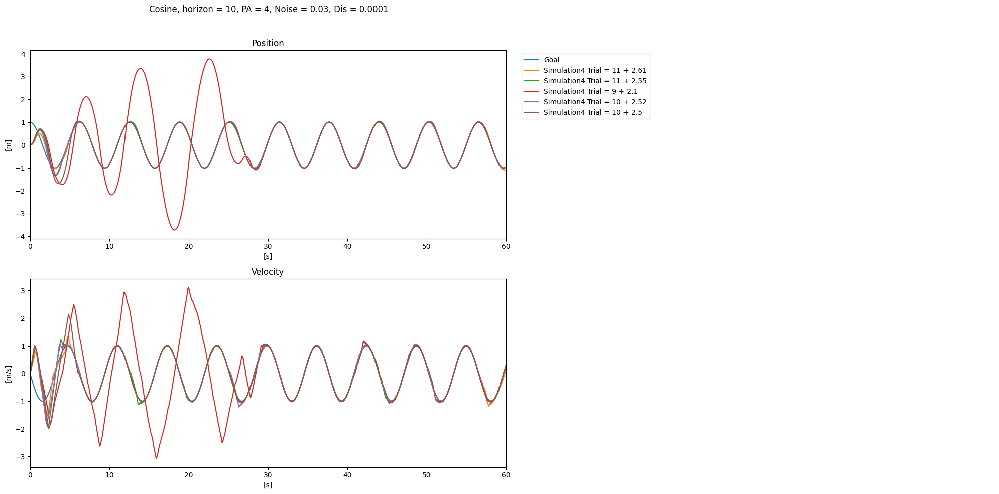

In [ ]:
A = []
L = []
for i in range(5):
    A.append(read_one(f'Data2/Cos4/Cos1H310Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'Cosine, horizon = 10, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_1D_Graphic(title, L, A)  

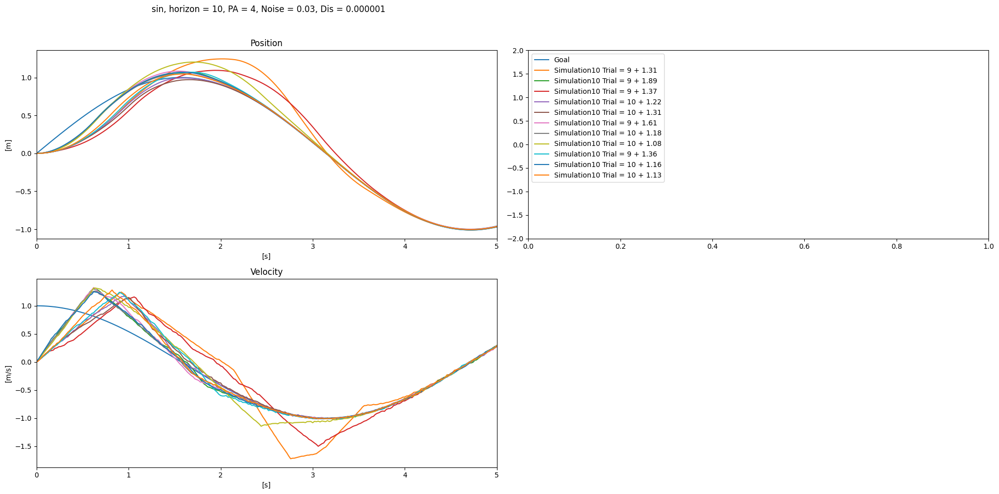

In [ ]:

A = []
L = []
for i in range(11):
    A.append(read_one(f'Data2/Sin/sin1Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[5]))} + {round(statistics.stdev(Data[5]), 2)}')


title = 'sin, horizon = 10, PA = 4, Noise = 0.03, Dis = 0.000001' 
Create_1D_Graphic(title, L, A)  

79.97902097902097
1.3106893106893107
1.3956043956043955
1.2747252747252746
1.2497502497502497


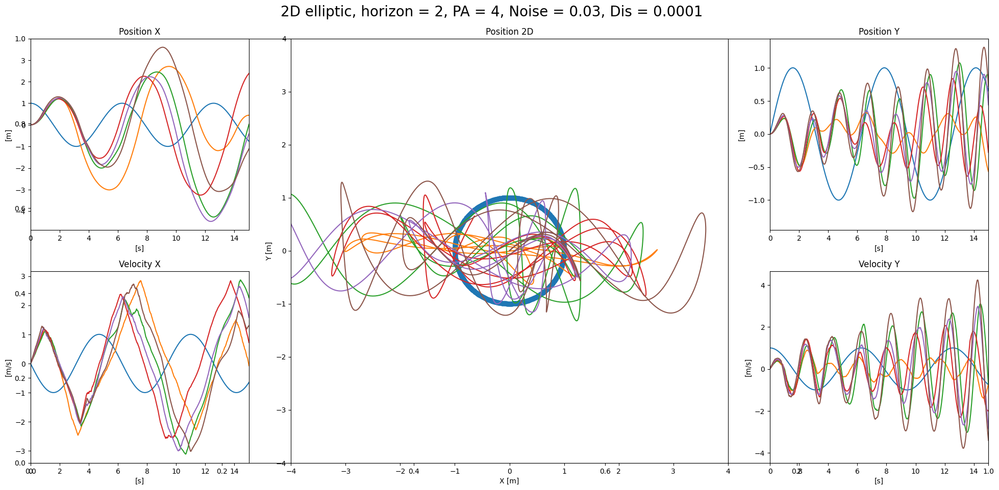

IndexError: list index out of range

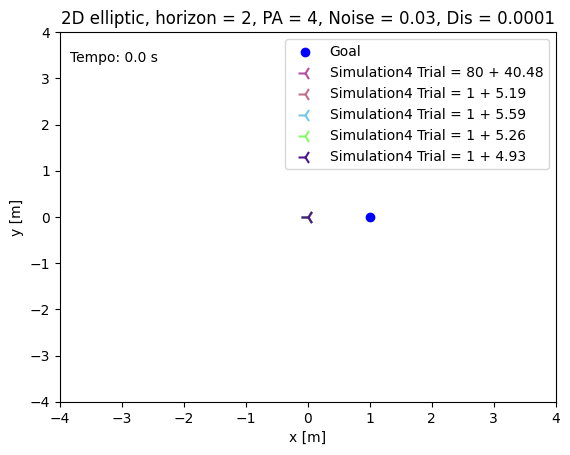

In [ ]:
A = []
L = []
for i in range(5):
    A.append(read_one_2D(f'Data2/2D/Eliptic/Coupled/2DelpticH22Data{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D elliptic, horizon = 2, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 15)  
create_animation(A,title , L, 'elliptical_coupled_model')


105.69507323568575
95.4034620505992
93.76564580559254
97.0612516644474
108.63382157123834
98.70039946737683
102.26498002663116
104.0918774966711
102.2809587217044
99.762982689747


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


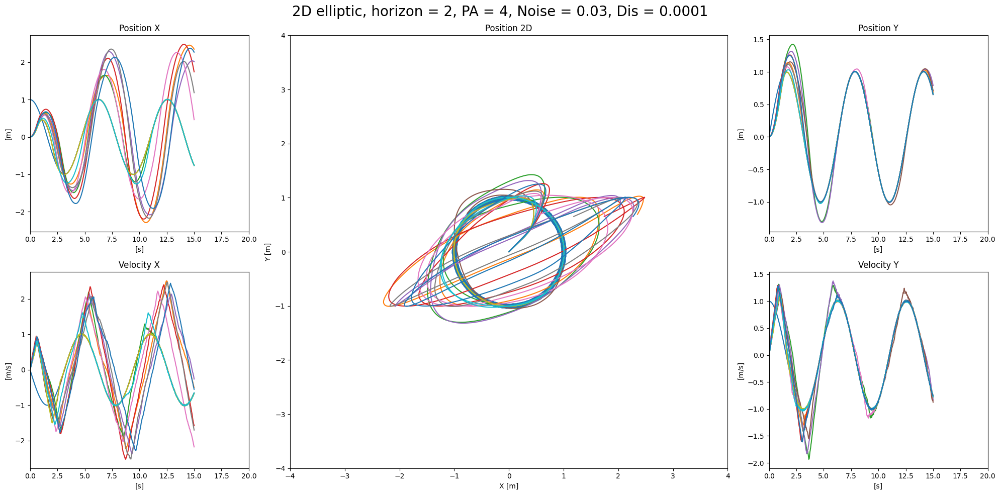

In [ ]:
A = []
L = []
for i in range(10):
    A.append(read_one_2D(f'Data2/2D/Eliptic/Uncoupled/2DelpticUncoupledData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D elliptic, horizon = 2, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 20)  

94.64611796067977
94.67744085304898
90.16494501832723
88.59713428857047
103.7890703098967


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


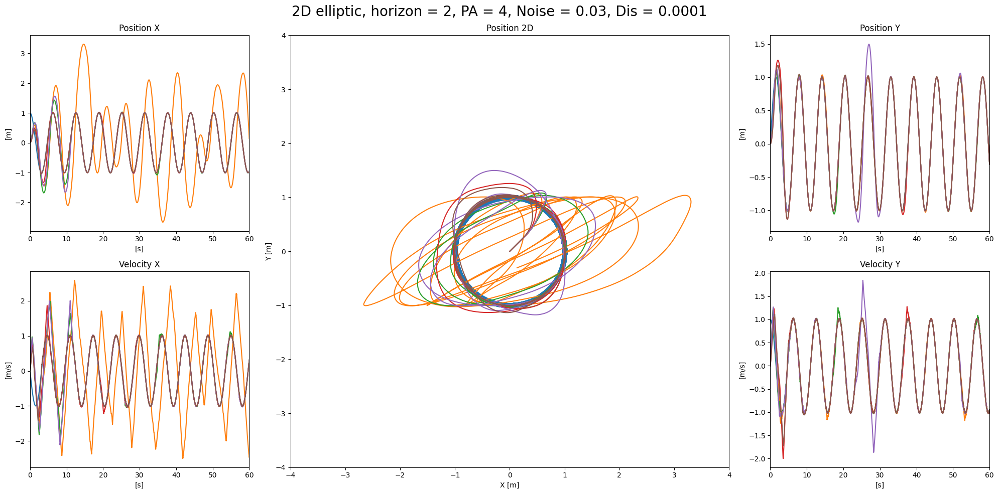

In [ ]:
A = []
L = []
for i in range(5):
    A.append(read_one_2D(f'Data2/2D/Eliptic/Uncoupled/2/2DelpticUncoupledData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D elliptic, horizon = 2, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 60)  

9.784405198267244
11.064978340553148
12.025324891702766
11.410529823392203


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


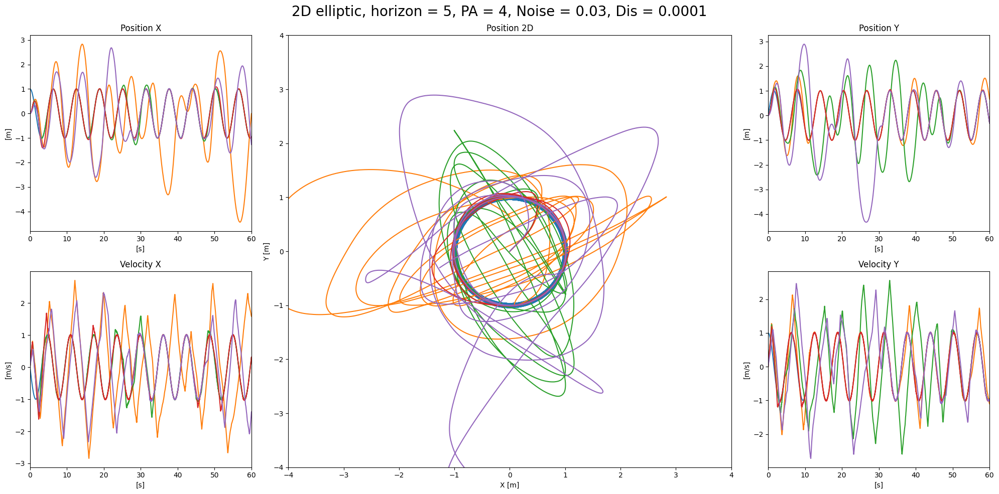

In [ ]:
A = []
L = []
for i in range(4):
    A.append(read_one_2D(f'Data2/2D/Eliptic/Uncoupled/3/2DelpticUncoupledData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D elliptic, horizon = 5, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 60)  

14.74175274908364
13.35988003998667
10.743752082639121
12.465511496167943


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


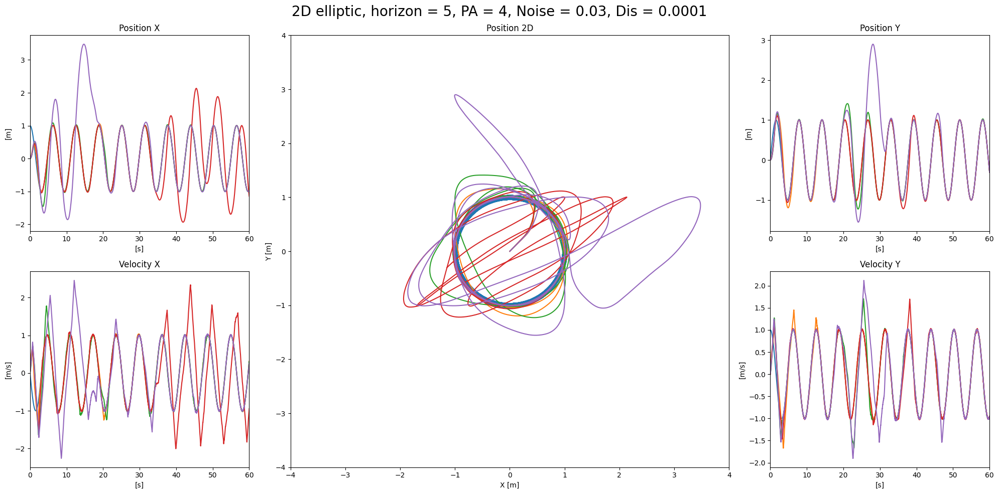

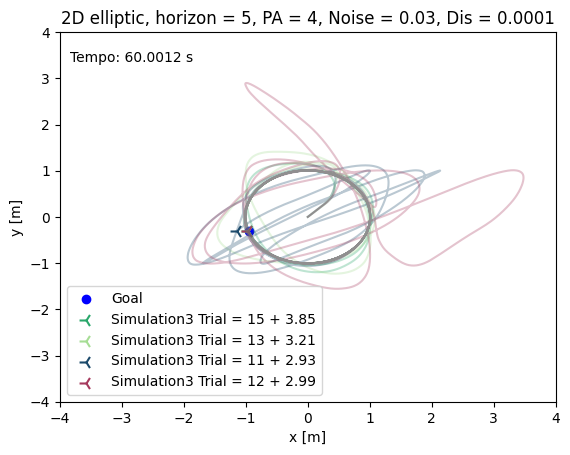

In [ ]:
A = []
L = []
for i in range(4):
    A.append(read_one_2D(f'Data2/2D/Eliptic/Uncoupled/4/2DelpticUncoupledData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D elliptic, horizon = 5, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 60)  
create_animation(A,title , L, 'elliptical_coupled_model')

6.078614257161892
4.176548967355097
4.687541638907395
7.649566955363091
12.194536975349767
21.232511658894072
22.103930712858094
22.009993337774816
22.423717521652232
24.074616922051966


C:\Users\marco\AppData\Local\Temp\ipykernel_21176\2441037389.py:212: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  X = plt.subplot(gs[0, 0])


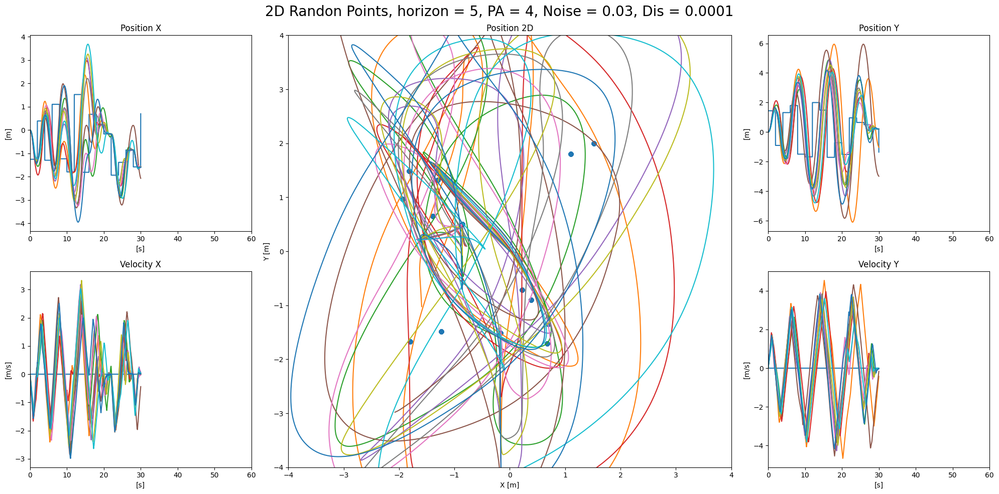

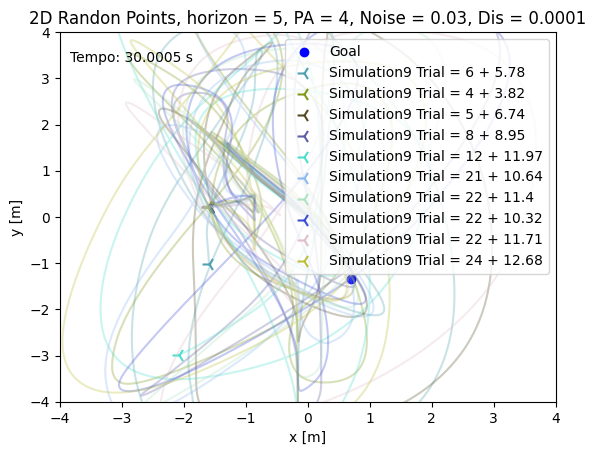

In [ ]:
A = []
L = []
for i in range(10):
    A.append(read_one_2D(f'Data2/2D/Points/Coupled/2DalCupledData{i}.csv'))
    
for Data in A:
    L.append(f'Simulation{i} Trial = {round(statistics.mean(Data[9]))} + {round(statistics.stdev(Data[9]), 2)}')
    print(statistics.mean(Data[9]))

title = '2D Randon Points, horizon = 5, PA = 4, Noise = 0.03, Dis = 0.0001' 
Create_2D_Graphic(title, A, 60)  
create_animation(A,title , L, 'RandonPoints_Uncoupled_model')